In [1]:
# 라이브러리 설치
!pip install segmentation-models-pytorch
!pip install albumentations

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 106.7/106.7 kB 12.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 81.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 17.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 84.1 MB/s eta 0:00:00
  Created wheel for efficientnet-pytorch: filename=efficientnet_pytorch-0.7.1-py3-none-any.whl size=16428 sha256=d75fe3c6d199ecf5f136dbe03512f82078bba2f8c06ab9b4824802a681619814
  Stored in directory: /root/.cache/pip/wheels/22/16/f1/5369d23a06852d5f083d23a1addf0904575f1296f71b412ac8
  Created wheel for pretrainedmodels: filename=pretrainedmodels-0.7.4-py3-none-any.whl size=60943 sha256=871a15535669c99f13539a54db2db274dd17c905738689d7a37d78734a523360
  Stored in directory: /root/.cache/pip/wheels/1f/9b/f5/9ccf39b50bc437986145107e2ced70a6fab622cf23e4795aa5
Successfully built efficientnet-pyto

## Import

In [2]:
import os
import cv2
import pandas as pd
import numpy as np
import random

import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms

from tqdm import tqdm
import albumentations as A
from albumentations.pytorch import ToTensorV2

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

## Utils

In [3]:
# RLE 디코딩 함수
def rle_decode(mask_rle, shape):
    s = mask_rle.split()
    starts, lengths = [np.asarray(x, dtype=int) for x in (s[0:][::2], s[1:][::2])]
    starts -= 1
    ends = starts + lengths
    img = np.zeros(shape[0]*shape[1], dtype=np.uint8)
    for lo, hi in zip(starts, ends):
        img[lo:hi] = 1
    return img.reshape(shape)

# RLE 인코딩 함수
def rle_encode(mask):
    pixels = mask.flatten()
    pixels = np.concatenate([[0], pixels, [0]])
    runs = np.where(pixels[1:] != pixels[:-1])[0] + 1
    runs[1::2] -= runs[::2]
    return ' '.join(str(x) for x in runs)

In [4]:
import logging
import sys

def setup_logger(work_dir=None, logfile_name='log.txt', logger_name='logger'):
    logger = logging.getLogger(logger_name)
    if logger.hasHandlers():  # Already existed
        raise SystemExit(f'Logger name `{logger_name}` has already been set up!\n'
                            f'Please use another name, or otherwise the messages '
                            f'may be mixed between these two loggers.')

    logger.setLevel(logging.DEBUG)
    formatter = logging.Formatter("[%(asctime)s][%(levelname)s] %(message)s")
    # Print log message with `INFO` level or above onto the screen.
    sh = logging.StreamHandler(stream=sys.stdout)
    sh.setLevel(logging.DEBUG)
    sh.setFormatter(formatter)
    logger.addHandler(sh)

    if not logfile_name:
        return logger

    work_dir = work_dir or DEFAULT_WORK_DIR
    logfile_name = os.path.join(work_dir, logfile_name)
    os.makedirs(work_dir, exist_ok=True)

    # Save log message with all levels in log file.
    fh = logging.FileHandler(logfile_name)
    fh.setLevel(logging.DEBUG)
    fh.setFormatter(formatter)
    logger.addHandler(fh)

    return logger

## Custom Dataset

In [5]:
class SatelliteDataset(Dataset):
    def __init__(self, csv_file, transform=None, infer=False, valid=False):
        self.data = pd.read_csv(csv_file)
        self.transform = transform
        self.infer = infer
        self.valid = valid

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        img_path = self.data.iloc[idx, 1]
        image = cv2.imread(img_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        image_orig = image[:]
                
        if self.infer:
            if self.transform:
                image = self.transform(image=image)['image']
            if self.valid:
                return image, image_orig
            return image

        mask_rle = self.data.iloc[idx, 2]
        mask = rle_decode(mask_rle, (image.shape[0], image.shape[1]))
        
        if self.valid:
            augmented = self.transform(image=image, mask=mask)
            image = augmented['image']
            mask = augmented['mask']
            return image, mask, image_orig

        if self.transform:
            augmented = self.transform(image=image, mask=mask)
            image = augmented['image']
            mask = augmented['mask']
        return image, mask

In [6]:
def set_seed(random_seed):
    torch.manual_seed(random_seed)
    torch.cuda.manual_seed(random_seed)
    torch.cuda.manual_seed_all(random_seed) # if use multi-GPU
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
    np.random.seed(random_seed)
    random.seed(random_seed)

## Data Loader

In [7]:
transform = A.Compose(
    [   
        A.augmentations.crops.transforms.RandomCrop(224, 224),
        A.augmentations.geometric.rotate.RandomRotate90(),
        A.augmentations.geometric.transforms.VerticalFlip(),
        A.augmentations.geometric.transforms.HorizontalFlip(),
        A.augmentations.transforms.Normalize(),
        ToTensorV2()
    ]
)

dataset = SatelliteDataset(csv_file='./train.csv', transform=transform)

# set batch_size and num_workers
dataloader = DataLoader(dataset, batch_size=64, shuffle=True, num_workers=8)

## Model Train

https://github.com/qubvel/segmentation_models.pytorch

https://smp.readthedocs.io/en/latest/

Unet++, DeepLabV3+ 등 라이브러리에 구현되어 있는 Segmentation Models와 Resnet 등 Encoder 조합으로 실험 가능 (efficientnet 사용시 엄청 느림, 사용 x)

In [8]:
ckpt_path = './'
logger = setup_logger(ckpt_path, 'result.log', 'logger')

In [ ]:
import segmentation_models_pytorch as smp

# 재현성을 위한 seed 초기화
set_seed(42)

# model 초기화
model = smp.UnetPlusPlus(
    encoder_name="resnet101",        # choose encoder, e.g. mobilenet_v2 or efficientnet-b7
    encoder_weights="imagenet",     # use `imagenet` pre-trained weights for encoder initialization
    in_channels=3,                  # model input channels (1 for gray-scale images, 3 for RGB, etc.)
    classes=1,                      # model output channels (number of classes in your dataset)
).to(device)

# debug with logger
logger.debug("UnetPlusPlus with resnet101(+Flip)")

# multi-gpu
# model = nn.DataParallel(model).to(device)

# 가중치를 불러올 경우 (이전 가중치로부터 계속해서 추가학습 등)
state_dict = torch.load('./UPP_rn101_cr224_Flip_2000ep.pt')
model.load_state_dict(state_dict)
start_epoch = 2000

# loss function과 optimizer 정의
criterion = torch.nn.BCEWithLogitsLoss()
optimizer = torch.optim.AdamW(model.parameters(), lr=0.0006)

model_losses = []

# training loop
#for epoch in range(1000):  # 500 에폭 동안 학습합니다.
for epoch in range(start_epoch, 3001):  # 500 에폭 동안 학습합니다.
    model.train()
    epoch_loss = 0
    for images, masks in tqdm(dataloader):
        images = images.float().to(device)
        masks = masks.float().to(device)

        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, masks.unsqueeze(1))
        loss.backward()
        optimizer.step()

        epoch_loss += loss.item()

    logger.debug(f'Epoch {epoch+1}, Loss: {epoch_loss/len(dataloader)}')
    
    # 100 에폭마다 저장합니다
    if (epoch+1) % 100 == 0:
        model_losses.append(epoch_loss/len(dataloader))
        torch.save(model.state_dict(), f'./UPP_rn101_cr224_Flip_{epoch+1}ep.pt')

Downloading: "https://download.pytorch.org/models/resnet101-5d3b4d8f.pth" to /root/.cache/torch/hub/checkpoints/resnet101-5d3b4d8f.pth


  0%|          | 0.00/170M [00:00<?, ?B/s]

[2023-07-27 13:45:38,761][DEBUG] UnetPlusPlus with resnet101(+Flip)


100%|██████████| 112/112 [01:41<00:00,  1.10it/s]

[2023-07-27 13:47:22,257][DEBUG] Epoch 2001, Loss: 0.027331174168336605



100%|██████████| 112/112 [01:38<00:00,  1.13it/s]

[2023-07-27 13:49:01,031][DEBUG] Epoch 2002, Loss: 0.027284914103802294



100%|██████████| 112/112 [01:38<00:00,  1.13it/s]

[2023-07-27 13:50:39,820][DEBUG] Epoch 2003, Loss: 0.027609406587933854



100%|██████████| 112/112 [01:38<00:00,  1.13it/s]

[2023-07-27 13:52:18,630][DEBUG] Epoch 2004, Loss: 0.0268748797243461



100%|██████████| 112/112 [01:38<00:00,  1.13it/s]

[2023-07-27 13:53:57,472][DEBUG] Epoch 2005, Loss: 0.02756214970057564



100%|██████████| 112/112 [01:38<00:00,  1.13it/s]

[2023-07-27 13:55:36,347][DEBUG] Epoch 2006, Loss: 0.02841409605129489



100%|██████████| 112/112 [01:39<00:00,  1.12it/s]

[2023-07-27 13:57:15,971][DEBUG] Epoch 2007, Loss: 0.027207638453026966



100%|██████████| 112/112 [01:39<00:00,  1.13it/s]

[2023-07-27 13:58:55,039][DEBUG] Epoch 2008, Loss: 0.02774867586724992



100%|██████████| 112/112 [01:39<00:00,  1.12it/s]

[2023-07-27 14:00:34,698][DEBUG] Epoch 2009, Loss: 0.026682206712264036



100%|██████████| 112/112 [01:38<00:00,  1.13it/s]

[2023-07-27 14:02:13,490][DEBUG] Epoch 2010, Loss: 0.026809373288415372



100%|██████████| 112/112 [01:39<00:00,  1.12it/s]

[2023-07-27 14:03:53,439][DEBUG] Epoch 2011, Loss: 0.028775305703415403



100%|██████████| 112/112 [01:38<00:00,  1.13it/s]

[2023-07-27 14:05:32,390][DEBUG] Epoch 2012, Loss: 0.027965794250901257



100%|██████████| 112/112 [01:39<00:00,  1.13it/s]

[2023-07-27 14:07:11,585][DEBUG] Epoch 2013, Loss: 0.02667743870655873



100%|██████████| 112/112 [01:39<00:00,  1.12it/s]

[2023-07-27 14:08:51,480][DEBUG] Epoch 2014, Loss: 0.027743983564765325



100%|██████████| 112/112 [01:39<00:00,  1.13it/s]

[2023-07-27 14:10:30,793][DEBUG] Epoch 2015, Loss: 0.027648032310285738



100%|██████████| 112/112 [01:39<00:00,  1.13it/s]

[2023-07-27 14:12:10,040][DEBUG] Epoch 2016, Loss: 0.029189415342573608



100%|██████████| 112/112 [01:39<00:00,  1.13it/s]

[2023-07-27 14:13:49,123][DEBUG] Epoch 2017, Loss: 0.02801884912020926



100%|██████████| 112/112 [01:39<00:00,  1.13it/s]

[2023-07-27 14:15:28,665][DEBUG] Epoch 2018, Loss: 0.02754964165589107



100%|██████████| 112/112 [01:39<00:00,  1.13it/s]

[2023-07-27 14:17:07,956][DEBUG] Epoch 2019, Loss: 0.02743468596599996



100%|██████████| 112/112 [01:39<00:00,  1.13it/s]

[2023-07-27 14:18:47,149][DEBUG] Epoch 2020, Loss: 0.027420073963834772



100%|██████████| 112/112 [01:39<00:00,  1.13it/s]

[2023-07-27 14:20:26,256][DEBUG] Epoch 2021, Loss: 0.028327095821233734



100%|██████████| 112/112 [01:39<00:00,  1.13it/s]

[2023-07-27 14:22:05,532][DEBUG] Epoch 2022, Loss: 0.02680116015419896



100%|██████████| 112/112 [01:39<00:00,  1.12it/s]

[2023-07-27 14:23:45,140][DEBUG] Epoch 2023, Loss: 0.026629043593337492



100%|██████████| 112/112 [01:38<00:00,  1.13it/s]

[2023-07-27 14:25:24,066][DEBUG] Epoch 2024, Loss: 0.027834873330513283



100%|██████████| 112/112 [01:39<00:00,  1.13it/s]

[2023-07-27 14:27:03,260][DEBUG] Epoch 2025, Loss: 0.02771513333677181



100%|██████████| 112/112 [01:38<00:00,  1.13it/s]

[2023-07-27 14:28:42,134][DEBUG] Epoch 2026, Loss: 0.02733008493669331



100%|██████████| 112/112 [01:39<00:00,  1.12it/s]

[2023-07-27 14:30:21,787][DEBUG] Epoch 2027, Loss: 0.026757362065836787



100%|██████████| 112/112 [01:39<00:00,  1.12it/s]

[2023-07-27 14:32:01,640][DEBUG] Epoch 2028, Loss: 0.027066874134886478



100%|██████████| 112/112 [01:39<00:00,  1.13it/s]

[2023-07-27 14:33:40,765][DEBUG] Epoch 2029, Loss: 0.027596408235175268



100%|██████████| 112/112 [01:39<00:00,  1.13it/s]

[2023-07-27 14:35:19,987][DEBUG] Epoch 2030, Loss: 0.02651525762796934



100%|██████████| 112/112 [01:39<00:00,  1.12it/s]

[2023-07-27 14:36:59,798][DEBUG] Epoch 2031, Loss: 0.02691296496362026



100%|██████████| 112/112 [01:39<00:00,  1.12it/s]

[2023-07-27 14:38:39,800][DEBUG] Epoch 2032, Loss: 0.02697605065934892



100%|██████████| 112/112 [01:39<00:00,  1.12it/s]

[2023-07-27 14:40:19,629][DEBUG] Epoch 2033, Loss: 0.027545584848017564



100%|██████████| 112/112 [01:39<00:00,  1.13it/s]

[2023-07-27 14:41:58,758][DEBUG] Epoch 2034, Loss: 0.027905102586373687



100%|██████████| 112/112 [01:38<00:00,  1.13it/s]

[2023-07-27 14:43:37,633][DEBUG] Epoch 2035, Loss: 0.026891920898508812



100%|██████████| 112/112 [01:39<00:00,  1.13it/s]

[2023-07-27 14:45:17,172][DEBUG] Epoch 2036, Loss: 0.026741383697039316



100%|██████████| 112/112 [01:38<00:00,  1.13it/s]

[2023-07-27 14:46:55,915][DEBUG] Epoch 2037, Loss: 0.02775580048494573



100%|██████████| 112/112 [01:38<00:00,  1.13it/s]

[2023-07-27 14:48:34,894][DEBUG] Epoch 2038, Loss: 0.027206381184181998



100%|██████████| 112/112 [01:39<00:00,  1.13it/s]

[2023-07-27 14:50:13,978][DEBUG] Epoch 2039, Loss: 0.02738446941865342



100%|██████████| 112/112 [01:38<00:00,  1.13it/s]

[2023-07-27 14:51:52,795][DEBUG] Epoch 2040, Loss: 0.026572882413997183



100%|██████████| 112/112 [01:38<00:00,  1.13it/s]

[2023-07-27 14:53:31,665][DEBUG] Epoch 2041, Loss: 0.027776560762764087



100%|██████████| 112/112 [01:39<00:00,  1.12it/s]

[2023-07-27 14:55:11,277][DEBUG] Epoch 2042, Loss: 0.02731330764280366



100%|██████████| 112/112 [01:39<00:00,  1.13it/s]

[2023-07-27 14:56:50,810][DEBUG] Epoch 2043, Loss: 0.027284282126596997



100%|██████████| 112/112 [01:39<00:00,  1.13it/s]

[2023-07-27 14:58:30,296][DEBUG] Epoch 2044, Loss: 0.028084758286630467



100%|██████████| 112/112 [01:39<00:00,  1.12it/s]

[2023-07-27 15:00:10,007][DEBUG] Epoch 2045, Loss: 0.027155382791534066



100%|██████████| 112/112 [01:39<00:00,  1.13it/s]

[2023-07-27 15:01:49,328][DEBUG] Epoch 2046, Loss: 0.02683193773762988



100%|██████████| 112/112 [01:38<00:00,  1.13it/s]

[2023-07-27 15:03:28,212][DEBUG] Epoch 2047, Loss: 0.02708574617281556



100%|██████████| 112/112 [01:38<00:00,  1.13it/s]

[2023-07-27 15:05:07,206][DEBUG] Epoch 2048, Loss: 0.026930877123959363



100%|██████████| 112/112 [01:38<00:00,  1.13it/s]

[2023-07-27 15:06:46,123][DEBUG] Epoch 2049, Loss: 0.027502372544924065



100%|██████████| 112/112 [01:39<00:00,  1.13it/s]

[2023-07-27 15:08:25,537][DEBUG] Epoch 2050, Loss: 0.02701173202201192



100%|██████████| 112/112 [01:39<00:00,  1.12it/s]

[2023-07-27 15:10:05,199][DEBUG] Epoch 2051, Loss: 0.02707787202338555



100%|██████████| 112/112 [01:39<00:00,  1.13it/s]

[2023-07-27 15:11:44,494][DEBUG] Epoch 2052, Loss: 0.02655597180793328



100%|██████████| 112/112 [01:39<00:00,  1.12it/s]

[2023-07-27 15:13:24,100][DEBUG] Epoch 2053, Loss: 0.026734730428350822



100%|██████████| 112/112 [01:39<00:00,  1.12it/s]

[2023-07-27 15:15:04,015][DEBUG] Epoch 2054, Loss: 0.02717745254215385



100%|██████████| 112/112 [01:40<00:00,  1.12it/s]

[2023-07-27 15:16:44,248][DEBUG] Epoch 2055, Loss: 0.026356976346245835



100%|██████████| 112/112 [01:39<00:00,  1.12it/s]


[2023-07-27 15:18:24,054][DEBUG] Epoch 2056, Loss: 0.028493956213683953


100%|██████████| 112/112 [01:40<00:00,  1.11it/s]

[2023-07-27 15:20:04,699][DEBUG] Epoch 2057, Loss: 0.027259178210182915



100%|██████████| 112/112 [01:39<00:00,  1.12it/s]

[2023-07-27 15:21:44,629][DEBUG] Epoch 2058, Loss: 0.02757195572900985



100%|██████████| 112/112 [01:39<00:00,  1.12it/s]

[2023-07-27 15:23:24,493][DEBUG] Epoch 2059, Loss: 0.026951001108890132



100%|██████████| 112/112 [01:39<00:00,  1.12it/s]

[2023-07-27 15:25:04,490][DEBUG] Epoch 2060, Loss: 0.027542015820342516



100%|██████████| 112/112 [01:39<00:00,  1.12it/s]

[2023-07-27 15:26:44,215][DEBUG] Epoch 2061, Loss: 0.026794824516400695



100%|██████████| 112/112 [01:39<00:00,  1.13it/s]

[2023-07-27 15:28:23,775][DEBUG] Epoch 2062, Loss: 0.02680375792884401



100%|██████████| 112/112 [01:39<00:00,  1.12it/s]

[2023-07-27 15:30:03,501][DEBUG] Epoch 2063, Loss: 0.027559422139477516



100%|██████████| 112/112 [01:39<00:00,  1.12it/s]

[2023-07-27 15:31:43,359][DEBUG] Epoch 2064, Loss: 0.02739031198767147



100%|██████████| 112/112 [01:40<00:00,  1.12it/s]

[2023-07-27 15:33:23,391][DEBUG] Epoch 2065, Loss: 0.027018784412315915



100%|██████████| 112/112 [01:40<00:00,  1.12it/s]

[2023-07-27 15:35:03,453][DEBUG] Epoch 2066, Loss: 0.02649158169515431



100%|██████████| 112/112 [01:39<00:00,  1.12it/s]

[2023-07-27 15:36:43,038][DEBUG] Epoch 2067, Loss: 0.029157044232956



100%|██████████| 112/112 [01:39<00:00,  1.12it/s]

[2023-07-27 15:38:22,855][DEBUG] Epoch 2068, Loss: 0.027496605978480408



100%|██████████| 112/112 [01:40<00:00,  1.11it/s]

[2023-07-27 15:40:03,710][DEBUG] Epoch 2069, Loss: 0.027303687147130922



100%|██████████| 112/112 [01:40<00:00,  1.12it/s]

[2023-07-27 15:41:44,133][DEBUG] Epoch 2070, Loss: 0.02743147117351847



100%|██████████| 112/112 [01:41<00:00,  1.11it/s]

[2023-07-27 15:43:25,222][DEBUG] Epoch 2071, Loss: 0.026823852976251925



100%|██████████| 112/112 [01:39<00:00,  1.12it/s]

[2023-07-27 15:45:04,993][DEBUG] Epoch 2072, Loss: 0.02962174893556429



100%|██████████| 112/112 [01:40<00:00,  1.12it/s]

[2023-07-27 15:46:45,343][DEBUG] Epoch 2073, Loss: 0.028279305202886462



100%|██████████| 112/112 [01:40<00:00,  1.12it/s]

[2023-07-27 15:48:25,497][DEBUG] Epoch 2074, Loss: 0.029319195958253528



100%|██████████| 112/112 [01:40<00:00,  1.12it/s]

[2023-07-27 15:50:05,615][DEBUG] Epoch 2075, Loss: 0.02842712606902101



100%|██████████| 112/112 [01:40<00:00,  1.12it/s]

[2023-07-27 15:51:45,818][DEBUG] Epoch 2076, Loss: 0.027446266513184776



100%|██████████| 112/112 [01:40<00:00,  1.11it/s]

[2023-07-27 15:53:26,390][DEBUG] Epoch 2077, Loss: 0.026761578379331956



100%|██████████| 112/112 [01:41<00:00,  1.11it/s]

[2023-07-27 15:55:07,419][DEBUG] Epoch 2078, Loss: 0.02625709442820932



100%|██████████| 112/112 [01:40<00:00,  1.12it/s]

[2023-07-27 15:56:47,607][DEBUG] Epoch 2079, Loss: 0.026177324188340987



100%|██████████| 112/112 [01:40<00:00,  1.12it/s]

[2023-07-27 15:58:27,897][DEBUG] Epoch 2080, Loss: 0.026732938630240306



100%|██████████| 112/112 [01:40<00:00,  1.12it/s]

[2023-07-27 16:00:08,257][DEBUG] Epoch 2081, Loss: 0.02566923340782523



100%|██████████| 112/112 [01:40<00:00,  1.12it/s]

[2023-07-27 16:01:48,323][DEBUG] Epoch 2082, Loss: 0.02675114254400666



100%|██████████| 112/112 [01:39<00:00,  1.12it/s]

[2023-07-27 16:03:28,302][DEBUG] Epoch 2083, Loss: 0.026275932506125952



100%|██████████| 112/112 [01:40<00:00,  1.12it/s]

[2023-07-27 16:05:08,453][DEBUG] Epoch 2084, Loss: 0.026423412591351995



100%|██████████| 112/112 [01:39<00:00,  1.12it/s]

[2023-07-27 16:06:48,273][DEBUG] Epoch 2085, Loss: 0.026850469393788705



100%|██████████| 112/112 [01:39<00:00,  1.12it/s]

[2023-07-27 16:08:28,255][DEBUG] Epoch 2086, Loss: 0.028612621560958878



100%|██████████| 112/112 [01:40<00:00,  1.12it/s]

[2023-07-27 16:10:08,396][DEBUG] Epoch 2087, Loss: 0.027144387414279793



100%|██████████| 112/112 [01:40<00:00,  1.12it/s]

[2023-07-27 16:11:48,645][DEBUG] Epoch 2088, Loss: 0.026772081868589988



100%|██████████| 112/112 [01:39<00:00,  1.12it/s]

[2023-07-27 16:13:28,648][DEBUG] Epoch 2089, Loss: 0.026894218970223198



100%|██████████| 112/112 [01:39<00:00,  1.12it/s]

[2023-07-27 16:15:08,442][DEBUG] Epoch 2090, Loss: 0.02674406228054847



100%|██████████| 112/112 [01:39<00:00,  1.12it/s]

[2023-07-27 16:16:48,015][DEBUG] Epoch 2091, Loss: 0.026807773442539786



100%|██████████| 112/112 [01:40<00:00,  1.11it/s]

[2023-07-27 16:18:28,682][DEBUG] Epoch 2092, Loss: 0.026527979095200344



100%|██████████| 112/112 [01:39<00:00,  1.12it/s]

[2023-07-27 16:20:08,589][DEBUG] Epoch 2093, Loss: 0.02683976974471339



100%|██████████| 112/112 [01:39<00:00,  1.12it/s]

[2023-07-27 16:21:48,366][DEBUG] Epoch 2094, Loss: 0.02648529997428081



100%|██████████| 112/112 [01:40<00:00,  1.12it/s]

[2023-07-27 16:23:28,459][DEBUG] Epoch 2095, Loss: 0.027367173311566666



100%|██████████| 112/112 [01:39<00:00,  1.12it/s]

[2023-07-27 16:25:08,385][DEBUG] Epoch 2096, Loss: 0.027717589783216163



100%|██████████| 112/112 [01:40<00:00,  1.12it/s]

[2023-07-27 16:26:48,631][DEBUG] Epoch 2097, Loss: 0.02730640324963523



100%|██████████| 112/112 [01:39<00:00,  1.13it/s]

[2023-07-27 16:28:28,310][DEBUG] Epoch 2098, Loss: 0.02666342193593404



100%|██████████| 112/112 [01:39<00:00,  1.12it/s]

[2023-07-27 16:30:08,112][DEBUG] Epoch 2099, Loss: 0.026661435258574784



100%|██████████| 112/112 [01:39<00:00,  1.12it/s]

[2023-07-27 16:31:47,683][DEBUG] Epoch 2100, Loss: 0.02690928288003696



100%|██████████| 112/112 [01:39<00:00,  1.12it/s]

[2023-07-27 16:33:28,102][DEBUG] Epoch 2101, Loss: 0.026815325703604946



100%|██████████| 112/112 [01:39<00:00,  1.13it/s]

[2023-07-27 16:35:07,434][DEBUG] Epoch 2102, Loss: 0.027192846106897508



100%|██████████| 112/112 [01:39<00:00,  1.12it/s]

[2023-07-27 16:36:47,011][DEBUG] Epoch 2103, Loss: 0.028035784888613437



100%|██████████| 112/112 [01:39<00:00,  1.13it/s]

[2023-07-27 16:38:26,298][DEBUG] Epoch 2104, Loss: 0.027176121432733322



100%|██████████| 112/112 [01:39<00:00,  1.13it/s]

[2023-07-27 16:40:05,791][DEBUG] Epoch 2105, Loss: 0.027593256406752125



100%|██████████| 112/112 [01:39<00:00,  1.13it/s]

[2023-07-27 16:41:45,340][DEBUG] Epoch 2106, Loss: 0.02731100333455418



100%|██████████| 112/112 [01:39<00:00,  1.12it/s]

[2023-07-27 16:43:24,919][DEBUG] Epoch 2107, Loss: 0.02854212295330529



100%|██████████| 112/112 [01:39<00:00,  1.12it/s]

[2023-07-27 16:45:04,787][DEBUG] Epoch 2108, Loss: 0.02776166470721364



100%|██████████| 112/112 [01:40<00:00,  1.12it/s]

[2023-07-27 16:46:44,859][DEBUG] Epoch 2109, Loss: 0.02726580954289862



100%|██████████| 112/112 [01:39<00:00,  1.12it/s]

[2023-07-27 16:48:24,739][DEBUG] Epoch 2110, Loss: 0.02917809470091015



100%|██████████| 112/112 [01:39<00:00,  1.12it/s]

[2023-07-27 16:50:04,526][DEBUG] Epoch 2111, Loss: 0.028726073730337833



100%|██████████| 112/112 [01:39<00:00,  1.12it/s]

[2023-07-27 16:51:44,280][DEBUG] Epoch 2112, Loss: 0.030956773220428398



100%|██████████| 112/112 [01:39<00:00,  1.12it/s]

[2023-07-27 16:53:24,048][DEBUG] Epoch 2113, Loss: 0.029505566178288842



100%|██████████| 112/112 [01:39<00:00,  1.12it/s]

[2023-07-27 16:55:03,892][DEBUG] Epoch 2114, Loss: 0.028366201191342304



100%|██████████| 112/112 [01:40<00:00,  1.11it/s]

[2023-07-27 16:56:44,382][DEBUG] Epoch 2115, Loss: 0.028201742596658214



100%|██████████| 112/112 [01:39<00:00,  1.13it/s]

[2023-07-27 16:58:23,870][DEBUG] Epoch 2116, Loss: 0.02743290730619005



100%|██████████| 112/112 [01:39<00:00,  1.12it/s]

[2023-07-27 17:00:03,875][DEBUG] Epoch 2117, Loss: 0.02766493135797126



100%|██████████| 112/112 [01:40<00:00,  1.11it/s]

[2023-07-27 17:01:44,477][DEBUG] Epoch 2118, Loss: 0.027674230713663355



100%|██████████| 112/112 [01:39<00:00,  1.12it/s]

[2023-07-27 17:03:24,411][DEBUG] Epoch 2119, Loss: 0.02831327886919358



100%|██████████| 112/112 [01:39<00:00,  1.12it/s]

[2023-07-27 17:05:04,033][DEBUG] Epoch 2120, Loss: 0.026703719016430632



100%|██████████| 112/112 [01:39<00:00,  1.12it/s]

[2023-07-27 17:06:43,803][DEBUG] Epoch 2121, Loss: 0.027544367043966695



100%|██████████| 112/112 [01:39<00:00,  1.12it/s]

[2023-07-27 17:08:23,504][DEBUG] Epoch 2122, Loss: 0.026874057117051313



100%|██████████| 112/112 [01:39<00:00,  1.12it/s]

[2023-07-27 17:10:03,276][DEBUG] Epoch 2123, Loss: 0.027637299366428385



100%|██████████| 112/112 [01:39<00:00,  1.12it/s]

[2023-07-27 17:11:42,898][DEBUG] Epoch 2124, Loss: 0.02714996048182781



100%|██████████| 112/112 [01:39<00:00,  1.12it/s]

[2023-07-27 17:13:22,572][DEBUG] Epoch 2125, Loss: 0.02770784222853503



100%|██████████| 112/112 [01:39<00:00,  1.13it/s]

[2023-07-27 17:15:01,991][DEBUG] Epoch 2126, Loss: 0.026950297577838813



100%|██████████| 112/112 [01:39<00:00,  1.13it/s]

[2023-07-27 17:16:41,536][DEBUG] Epoch 2127, Loss: 0.026983071185116256



100%|██████████| 112/112 [01:39<00:00,  1.13it/s]

[2023-07-27 17:18:21,088][DEBUG] Epoch 2128, Loss: 0.026675044392634715



100%|██████████| 112/112 [01:39<00:00,  1.13it/s]

[2023-07-27 17:20:00,608][DEBUG] Epoch 2129, Loss: 0.02730345243721136



100%|██████████| 112/112 [01:39<00:00,  1.13it/s]

[2023-07-27 17:21:40,064][DEBUG] Epoch 2130, Loss: 0.026922596818102256



100%|██████████| 112/112 [01:39<00:00,  1.12it/s]

[2023-07-27 17:23:19,772][DEBUG] Epoch 2131, Loss: 0.0268012402812019



100%|██████████| 112/112 [01:39<00:00,  1.12it/s]

[2023-07-27 17:24:59,603][DEBUG] Epoch 2132, Loss: 0.027650001891223446



100%|██████████| 112/112 [01:40<00:00,  1.12it/s]

[2023-07-27 17:26:39,616][DEBUG] Epoch 2133, Loss: 0.0271366736685325



100%|██████████| 112/112 [01:39<00:00,  1.12it/s]

[2023-07-27 17:28:19,419][DEBUG] Epoch 2134, Loss: 0.028046103926109418



100%|██████████| 112/112 [01:40<00:00,  1.12it/s]

[2023-07-27 17:29:59,508][DEBUG] Epoch 2135, Loss: 0.027081904400672232



100%|██████████| 112/112 [01:40<00:00,  1.12it/s]

[2023-07-27 17:31:39,667][DEBUG] Epoch 2136, Loss: 0.02717700121658189



100%|██████████| 112/112 [01:39<00:00,  1.12it/s]

[2023-07-27 17:33:19,675][DEBUG] Epoch 2137, Loss: 0.026616356002965143



100%|██████████| 112/112 [01:40<00:00,  1.12it/s]

[2023-07-27 17:34:59,871][DEBUG] Epoch 2138, Loss: 0.026691320285733258



100%|██████████| 112/112 [01:40<00:00,  1.12it/s]

[2023-07-27 17:36:39,898][DEBUG] Epoch 2139, Loss: 0.02648915338795632



100%|██████████| 112/112 [01:39<00:00,  1.12it/s]

[2023-07-27 17:38:19,811][DEBUG] Epoch 2140, Loss: 0.026593735375042473



100%|██████████| 112/112 [01:40<00:00,  1.12it/s]

[2023-07-27 17:40:00,097][DEBUG] Epoch 2141, Loss: 0.026411562725635513



100%|██████████| 112/112 [01:40<00:00,  1.11it/s]

[2023-07-27 17:41:40,612][DEBUG] Epoch 2142, Loss: 0.026539069400834187



100%|██████████| 112/112 [01:40<00:00,  1.11it/s]

[2023-07-27 17:43:21,536][DEBUG] Epoch 2143, Loss: 0.026749442447908223



100%|██████████| 112/112 [01:40<00:00,  1.12it/s]

[2023-07-27 17:45:01,699][DEBUG] Epoch 2144, Loss: 0.02828962422375168



100%|██████████| 112/112 [01:40<00:00,  1.11it/s]

[2023-07-27 17:46:42,495][DEBUG] Epoch 2145, Loss: 0.02673964445213122



100%|██████████| 112/112 [01:39<00:00,  1.12it/s]

[2023-07-27 17:48:22,258][DEBUG] Epoch 2146, Loss: 0.02729495902479227



100%|██████████| 112/112 [01:40<00:00,  1.12it/s]

[2023-07-27 17:50:02,550][DEBUG] Epoch 2147, Loss: 0.028320251515002122



100%|██████████| 112/112 [01:40<00:00,  1.12it/s]

[2023-07-27 17:51:43,002][DEBUG] Epoch 2148, Loss: 0.02835890936798283



100%|██████████| 112/112 [01:40<00:00,  1.12it/s]

[2023-07-27 17:53:23,216][DEBUG] Epoch 2149, Loss: 0.0278698143582525



100%|██████████| 112/112 [01:40<00:00,  1.12it/s]

[2023-07-27 17:55:03,645][DEBUG] Epoch 2150, Loss: 0.027880950149015656



100%|██████████| 112/112 [01:40<00:00,  1.12it/s]

[2023-07-27 17:56:43,704][DEBUG] Epoch 2151, Loss: 0.027886389438728138



100%|██████████| 112/112 [01:39<00:00,  1.12it/s]

[2023-07-27 17:58:23,601][DEBUG] Epoch 2152, Loss: 0.027772066333065077



100%|██████████| 112/112 [01:40<00:00,  1.12it/s]

[2023-07-27 18:00:03,706][DEBUG] Epoch 2153, Loss: 0.027014343151157454



100%|██████████| 112/112 [01:40<00:00,  1.12it/s]

[2023-07-27 18:01:43,759][DEBUG] Epoch 2154, Loss: 0.028204342051010047



100%|██████████| 112/112 [01:39<00:00,  1.12it/s]

[2023-07-27 18:03:23,480][DEBUG] Epoch 2155, Loss: 0.029133408164073313



100%|██████████| 112/112 [01:38<00:00,  1.13it/s]

[2023-07-27 18:05:02,213][DEBUG] Epoch 2156, Loss: 0.02690520283899137



100%|██████████| 112/112 [01:37<00:00,  1.14it/s]

[2023-07-27 18:06:40,140][DEBUG] Epoch 2157, Loss: 0.02699638723528811



100%|██████████| 112/112 [01:37<00:00,  1.15it/s]

[2023-07-27 18:08:17,592][DEBUG] Epoch 2158, Loss: 0.026653459179215133



100%|██████████| 112/112 [01:37<00:00,  1.15it/s]

[2023-07-27 18:09:54,660][DEBUG] Epoch 2159, Loss: 0.026700874042165066



100%|██████████| 112/112 [01:36<00:00,  1.16it/s]

[2023-07-27 18:11:31,438][DEBUG] Epoch 2160, Loss: 0.02654398247666125



100%|██████████| 112/112 [01:36<00:00,  1.16it/s]

[2023-07-27 18:13:08,288][DEBUG] Epoch 2161, Loss: 0.027052801102399826



100%|██████████| 112/112 [01:37<00:00,  1.15it/s]

[2023-07-27 18:14:45,355][DEBUG] Epoch 2162, Loss: 0.02673666169201689



100%|██████████| 112/112 [01:37<00:00,  1.15it/s]

[2023-07-27 18:16:22,381][DEBUG] Epoch 2163, Loss: 0.0272339040613068



100%|██████████| 112/112 [01:36<00:00,  1.16it/s]

[2023-07-27 18:17:59,265][DEBUG] Epoch 2164, Loss: 0.028907457483001053



100%|██████████| 112/112 [01:36<00:00,  1.15it/s]

[2023-07-27 18:19:36,368][DEBUG] Epoch 2165, Loss: 0.027331785398668478



100%|██████████| 112/112 [01:36<00:00,  1.16it/s]

[2023-07-27 18:21:13,103][DEBUG] Epoch 2166, Loss: 0.027918763658297912



100%|██████████| 112/112 [01:36<00:00,  1.16it/s]

[2023-07-27 18:22:49,917][DEBUG] Epoch 2167, Loss: 0.027032708516344428



100%|██████████| 112/112 [01:36<00:00,  1.16it/s]

[2023-07-27 18:24:26,789][DEBUG] Epoch 2168, Loss: 0.027619487921973423



100%|██████████| 112/112 [01:36<00:00,  1.16it/s]

[2023-07-27 18:26:03,743][DEBUG] Epoch 2169, Loss: 0.029034205679116503



100%|██████████| 112/112 [01:36<00:00,  1.16it/s]

[2023-07-27 18:27:40,348][DEBUG] Epoch 2170, Loss: 0.02772903347587479



100%|██████████| 112/112 [01:37<00:00,  1.15it/s]

[2023-07-27 18:29:17,437][DEBUG] Epoch 2171, Loss: 0.027862430799619427



100%|██████████| 112/112 [01:36<00:00,  1.16it/s]

[2023-07-27 18:30:54,086][DEBUG] Epoch 2172, Loss: 0.0273408011666366



100%|██████████| 112/112 [01:36<00:00,  1.15it/s]

[2023-07-27 18:32:31,080][DEBUG] Epoch 2173, Loss: 0.027326107740269175



100%|██████████| 112/112 [01:36<00:00,  1.16it/s]

[2023-07-27 18:34:07,981][DEBUG] Epoch 2174, Loss: 0.027290205687417517



100%|██████████| 112/112 [01:36<00:00,  1.16it/s]

[2023-07-27 18:35:44,895][DEBUG] Epoch 2175, Loss: 0.026730429929947213



100%|██████████| 112/112 [01:37<00:00,  1.15it/s]

[2023-07-27 18:37:21,920][DEBUG] Epoch 2176, Loss: 0.02594594594224223



100%|██████████| 112/112 [01:36<00:00,  1.16it/s]

[2023-07-27 18:38:58,832][DEBUG] Epoch 2177, Loss: 0.027440311653273448



100%|██████████| 112/112 [01:36<00:00,  1.16it/s]

[2023-07-27 18:40:35,763][DEBUG] Epoch 2178, Loss: 0.029610103578306735



100%|██████████| 112/112 [01:36<00:00,  1.16it/s]

[2023-07-27 18:42:12,555][DEBUG] Epoch 2179, Loss: 0.030292309970328852



100%|██████████| 112/112 [01:36<00:00,  1.15it/s]

[2023-07-27 18:43:49,557][DEBUG] Epoch 2180, Loss: 0.029396095695639297



100%|██████████| 112/112 [01:37<00:00,  1.15it/s]

[2023-07-27 18:45:26,790][DEBUG] Epoch 2181, Loss: 0.028554799733683467



100%|██████████| 112/112 [01:36<00:00,  1.16it/s]

[2023-07-27 18:47:03,709][DEBUG] Epoch 2182, Loss: 0.027132763943102742



100%|██████████| 112/112 [01:36<00:00,  1.16it/s]

[2023-07-27 18:48:40,515][DEBUG] Epoch 2183, Loss: 0.027112072416847304



100%|██████████| 112/112 [01:36<00:00,  1.15it/s]

[2023-07-27 18:50:17,501][DEBUG] Epoch 2184, Loss: 0.028028238082437644



100%|██████████| 112/112 [01:37<00:00,  1.15it/s]

[2023-07-27 18:51:54,604][DEBUG] Epoch 2185, Loss: 0.0277854991145432



100%|██████████| 112/112 [01:37<00:00,  1.15it/s]

[2023-07-27 18:53:32,206][DEBUG] Epoch 2186, Loss: 0.02775599599616336



100%|██████████| 112/112 [01:36<00:00,  1.16it/s]

[2023-07-27 18:55:08,901][DEBUG] Epoch 2187, Loss: 0.02777699921612761



100%|██████████| 112/112 [01:36<00:00,  1.16it/s]

[2023-07-27 18:56:45,766][DEBUG] Epoch 2188, Loss: 0.027992291592194567



100%|██████████| 112/112 [01:37<00:00,  1.15it/s]

[2023-07-27 18:58:22,820][DEBUG] Epoch 2189, Loss: 0.027477986927676414



100%|██████████| 112/112 [01:36<00:00,  1.16it/s]

[2023-07-27 18:59:59,388][DEBUG] Epoch 2190, Loss: 0.02665481631577547



100%|██████████| 112/112 [01:37<00:00,  1.15it/s]

[2023-07-27 19:01:36,403][DEBUG] Epoch 2191, Loss: 0.026775297692178616



100%|██████████| 112/112 [01:37<00:00,  1.15it/s]

[2023-07-27 19:03:13,448][DEBUG] Epoch 2192, Loss: 0.026796561782248318



100%|██████████| 112/112 [01:37<00:00,  1.15it/s]

[2023-07-27 19:04:50,501][DEBUG] Epoch 2193, Loss: 0.030361094877922108



100%|██████████| 112/112 [01:37<00:00,  1.15it/s]

[2023-07-27 19:06:27,686][DEBUG] Epoch 2194, Loss: 0.027912499898645495



100%|██████████| 112/112 [01:36<00:00,  1.16it/s]

[2023-07-27 19:08:04,566][DEBUG] Epoch 2195, Loss: 0.027690853624205505



100%|██████████| 112/112 [01:36<00:00,  1.15it/s]

[2023-07-27 19:09:41,568][DEBUG] Epoch 2196, Loss: 0.027019013916807517



100%|██████████| 112/112 [01:36<00:00,  1.15it/s]

[2023-07-27 19:11:18,574][DEBUG] Epoch 2197, Loss: 0.02837103886330234



100%|██████████| 112/112 [01:37<00:00,  1.15it/s]

[2023-07-27 19:12:55,773][DEBUG] Epoch 2198, Loss: 0.027813709191312746



100%|██████████| 112/112 [01:36<00:00,  1.16it/s]

[2023-07-27 19:14:32,376][DEBUG] Epoch 2199, Loss: 0.026875963517730788



100%|██████████| 112/112 [01:36<00:00,  1.16it/s]

[2023-07-27 19:16:09,317][DEBUG] Epoch 2200, Loss: 0.026836094812357



100%|██████████| 112/112 [01:37<00:00,  1.15it/s]

[2023-07-27 19:17:46,791][DEBUG] Epoch 2201, Loss: 0.03005026896218104



100%|██████████| 112/112 [01:36<00:00,  1.16it/s]

[2023-07-27 19:19:23,614][DEBUG] Epoch 2202, Loss: 0.030361129619580294



100%|██████████| 112/112 [01:36<00:00,  1.16it/s]

[2023-07-27 19:21:00,491][DEBUG] Epoch 2203, Loss: 0.030421342268320068



100%|██████████| 112/112 [01:36<00:00,  1.16it/s]

[2023-07-27 19:22:37,253][DEBUG] Epoch 2204, Loss: 0.03146555163298866



100%|██████████| 112/112 [01:36<00:00,  1.16it/s]

[2023-07-27 19:24:14,215][DEBUG] Epoch 2205, Loss: 0.031012121521468674



100%|██████████| 112/112 [01:36<00:00,  1.16it/s]

[2023-07-27 19:25:51,190][DEBUG] Epoch 2206, Loss: 0.030201370994161283



100%|██████████| 112/112 [01:37<00:00,  1.15it/s]

[2023-07-27 19:27:28,263][DEBUG] Epoch 2207, Loss: 0.030514876773980047



100%|██████████| 112/112 [01:36<00:00,  1.16it/s]

[2023-07-27 19:29:05,167][DEBUG] Epoch 2208, Loss: 0.030681771924719214



100%|██████████| 112/112 [01:36<00:00,  1.16it/s]

[2023-07-27 19:30:42,119][DEBUG] Epoch 2209, Loss: 0.029677581058682075



100%|██████████| 112/112 [01:36<00:00,  1.16it/s]

[2023-07-27 19:32:18,993][DEBUG] Epoch 2210, Loss: 0.03038244624622166



100%|██████████| 112/112 [01:36<00:00,  1.16it/s]

[2023-07-27 19:33:55,877][DEBUG] Epoch 2211, Loss: 0.030402668452422534



100%|██████████| 112/112 [01:36<00:00,  1.15it/s]

[2023-07-27 19:35:32,883][DEBUG] Epoch 2212, Loss: 0.03138766379561275



100%|██████████| 112/112 [01:38<00:00,  1.14it/s]

[2023-07-27 19:37:11,041][DEBUG] Epoch 2213, Loss: 0.033033603469708135



 96%|█████████▌| 107/112 [01:33<00:04,  1.20it/s]

In [11]:
# 가중치를 불러올 경우

state_dict = torch.load('./UPP_rn101_cr224_Flip_2000ep.pt')
model.load_state_dict(state_dict)

<All keys matched successfully>

## Inference

In [12]:
transform = A.Compose(
    [   
        A.augmentations.transforms.Normalize(),
        ToTensorV2()
    ]
)

test_dataset = SatelliteDataset(csv_file='./test.csv', transform=transform, infer=True)

# set batch_size and num_workers
test_dataloader = DataLoader(test_dataset, batch_size=64, shuffle=False, num_workers=4)

In [13]:
with torch.no_grad():
    model.eval()
    result = []
    for images in tqdm(test_dataloader):
        images = images.float().to(device)        
        outputs = model(images)
        masks = torch.sigmoid(outputs).cpu().numpy()
        masks = np.squeeze(masks, axis=1)
        
        # set threshold 0.5
        masks = (masks > 0.35).astype(np.uint8) # Threshold = 0.35
        
        for i in range(len(images)):
            mask_rle = rle_encode(masks[i])
            if mask_rle == '': # 예측된 건물 픽셀이 아예 없는 경우 -1
                result.append(-1)
            else:
                result.append(mask_rle)

100%|██████████| 948/948 [04:25<00:00,  3.57it/s]


## Submission

In [14]:
submit = pd.read_csv('./sample_submission.csv')
submit['mask_rle'] = result

In [15]:
submit.head()

,img_id,mask_rle
0,TEST_00000,19779 9 20002 11 20031 9 20226 11 20255 10 204...
1,TEST_00001,35615 2 35837 4 36060 5 36282 7 36505 8 36728 ...
2,TEST_00002,-1
3,TEST_00003,21 24 73 12 242 27 297 11 465 29 522 8 689 29 ...
4,TEST_00004,16682 6 16895 18 16927 9 17114 24 17143 17 173...


In [16]:
submit.to_csv('./submission/UPP_rn101_cr224_Flip_2000ep.csv', index=False)

# Watch Result of Model

In [17]:
import matplotlib.pyplot as plt
def visualize_mask_and_image(image, masks, mask = None):
    if mask != None:
        fig, ax = plt.subplots(1, 3, figsize=(10, 5))
    else:
        fig, ax = plt.subplots(1, 2, figsize=(10, 5))

    # Display the image
    ax[0].imshow(image[0])
    ax[0].set_title('Image')
    
    # Display the mask
    ax[1].imshow(masks[0], cmap='gray')
    ax[1].set_title('Mask')
    
    if mask != None:
        # Display the mask
        ax[2].imshow(mask[0], cmap='gray')
        ax[2].set_title('GT')

    # Remove the axis labels
    for a in ax:
        a.axis('off')

    # Adjust the layout
    plt.tight_layout()
    plt.show()

# Train

In [18]:
transform = A.Compose(
    [   
        A.augmentations.crops.transforms.RandomCrop(224, 224),
        A.augmentations.transforms.Normalize(),
        ToTensorV2()
    ]
)

test_dataset = SatelliteDataset(csv_file='./train.csv', transform=transform, valid=True)
test_dataloader = DataLoader(test_dataset, batch_size=1, shuffle=False, num_workers=4)

  0%|          | 0/7140 [00:00<?, ?it/s]

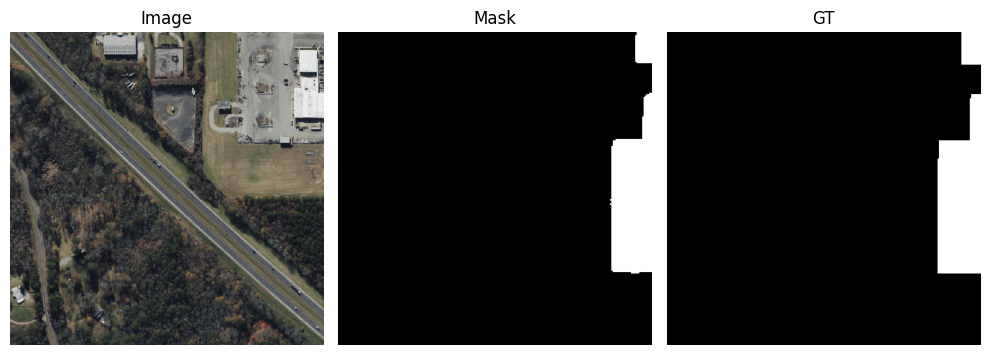

  0%|          | 1/7140 [00:00<1:37:37,  1.22it/s]

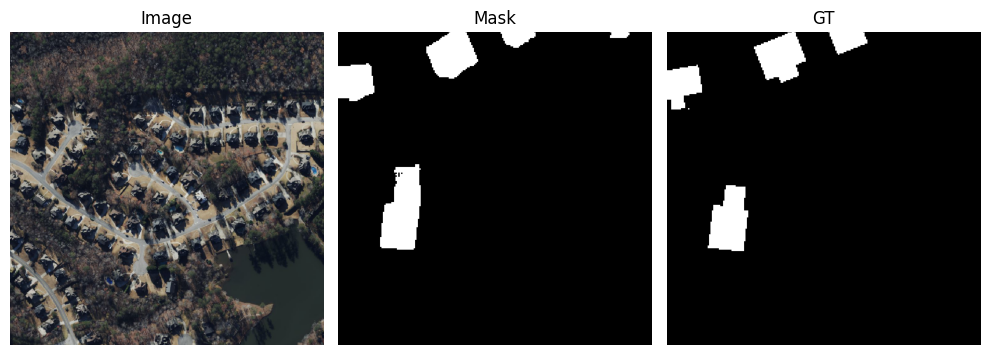

  0%|          | 2/7140 [00:01<1:13:49,  1.61it/s]

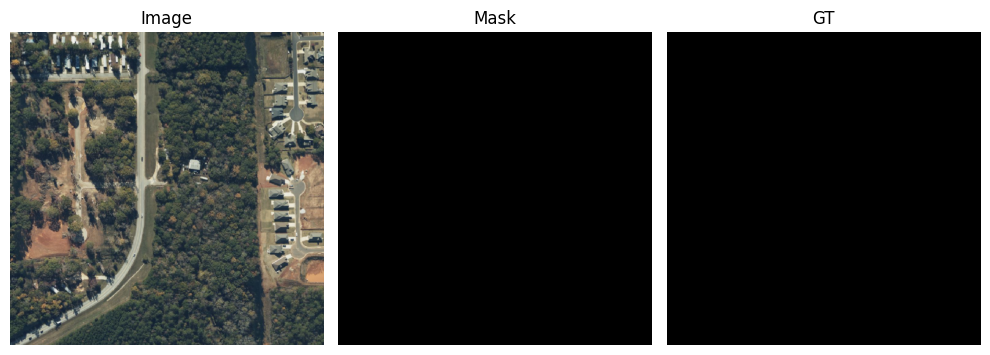

  0%|          | 3/7140 [00:01<55:06,  2.16it/s]  

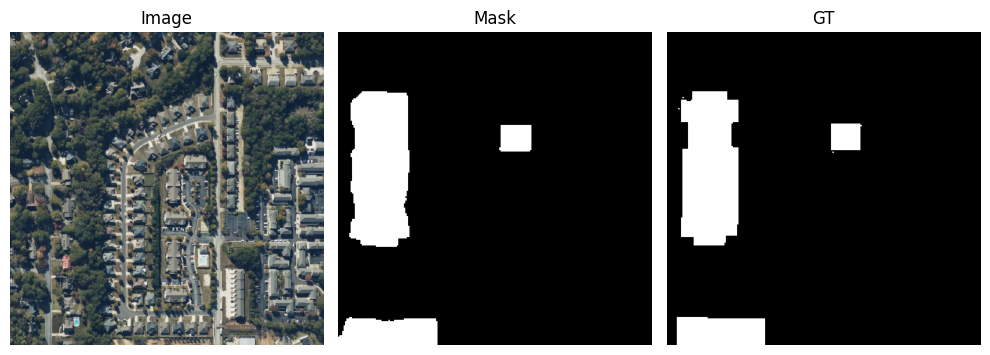

  0%|          | 4/7140 [00:01<46:57,  2.53it/s]

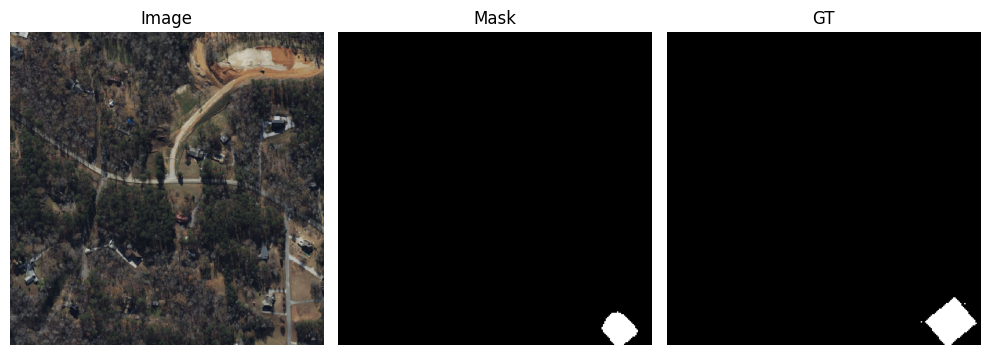

  0%|          | 5/7140 [00:02<42:25,  2.80it/s]

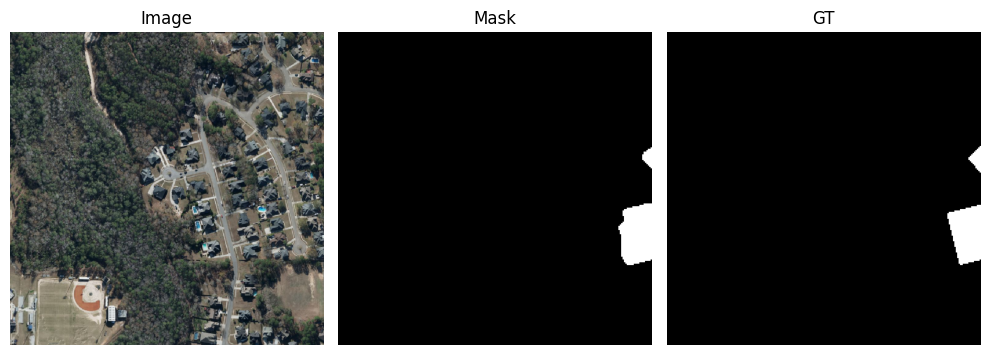

  0%|          | 6/7140 [00:02<39:58,  2.97it/s]

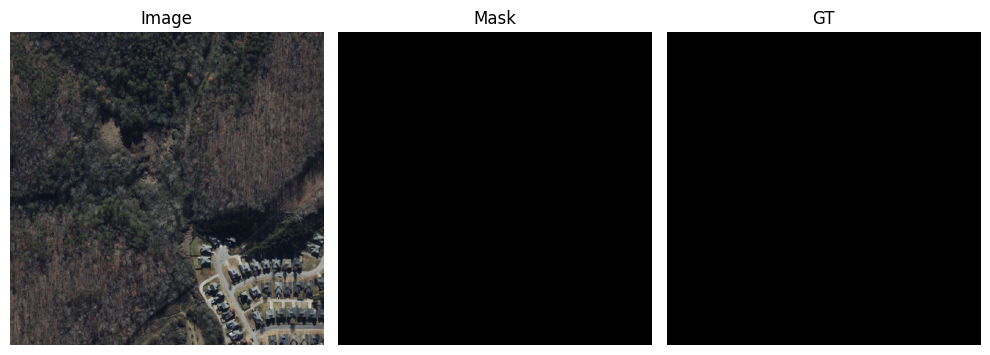

  0%|          | 7/7140 [00:02<38:15,  3.11it/s]

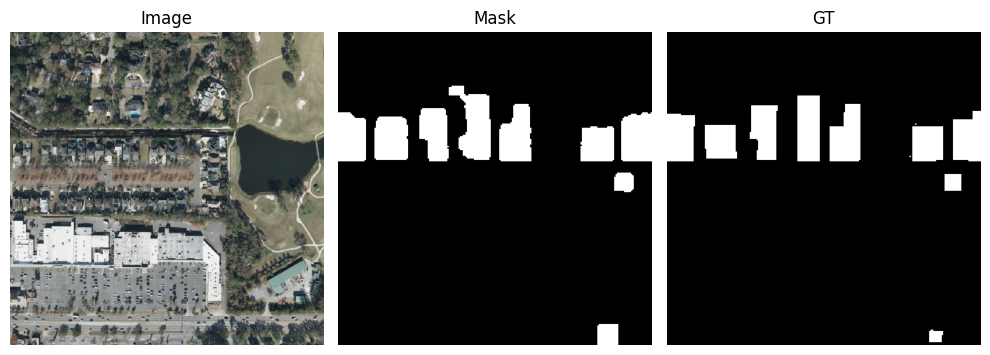

  0%|          | 8/7140 [00:03<37:12,  3.20it/s]

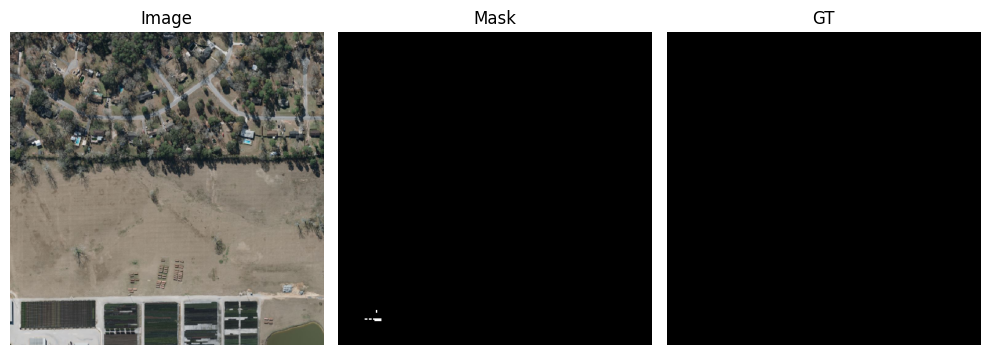

  0%|          | 9/7140 [00:03<36:20,  3.27it/s]

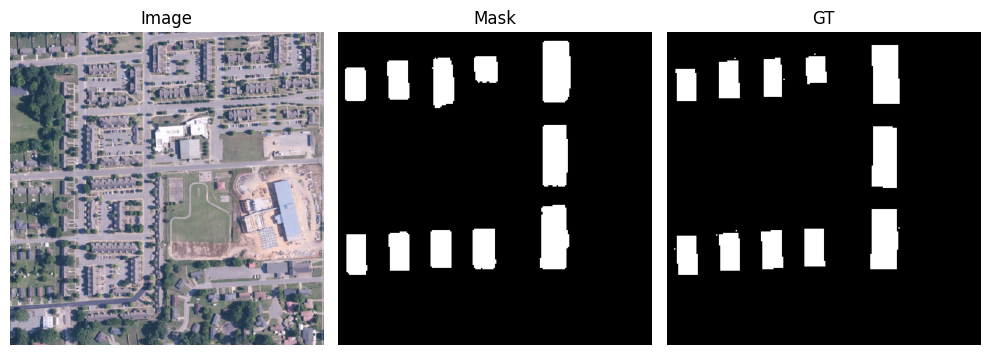

  0%|          | 10/7140 [00:03<35:41,  3.33it/s]

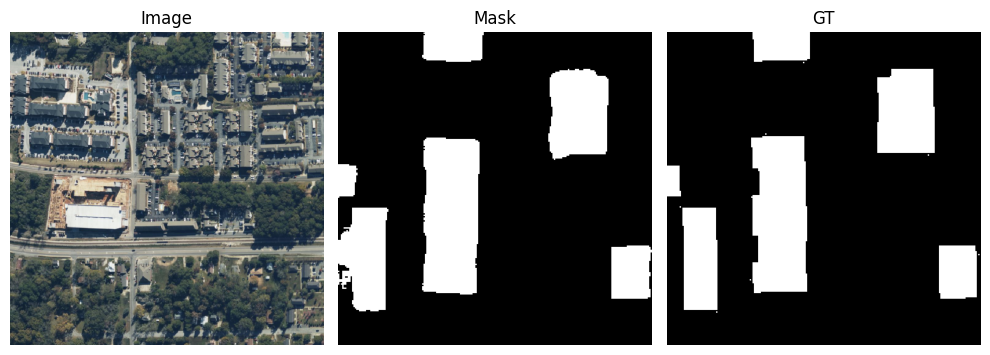

  0%|          | 11/7140 [00:03<35:42,  3.33it/s]

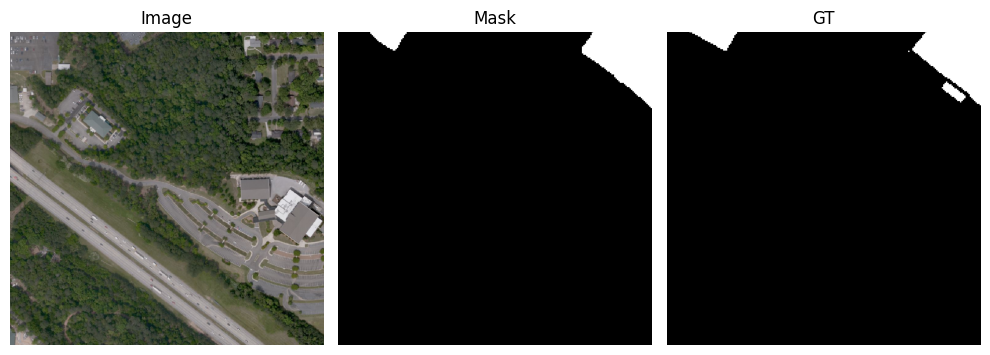

  0%|          | 12/7140 [00:04<35:24,  3.35it/s]

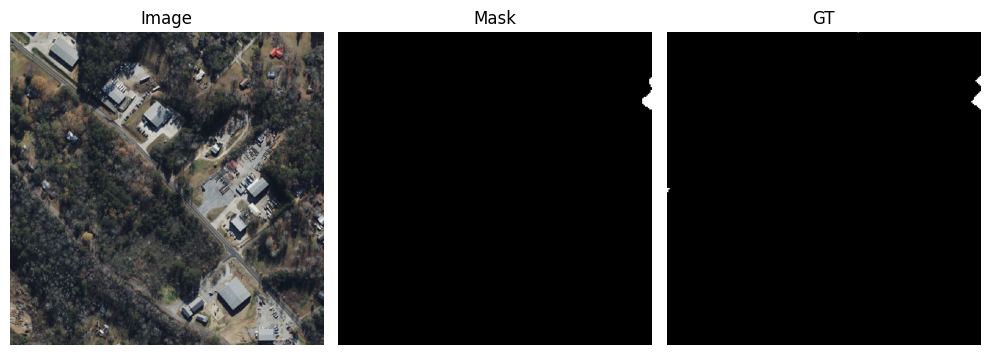

  0%|          | 13/7140 [00:04<35:11,  3.38it/s]

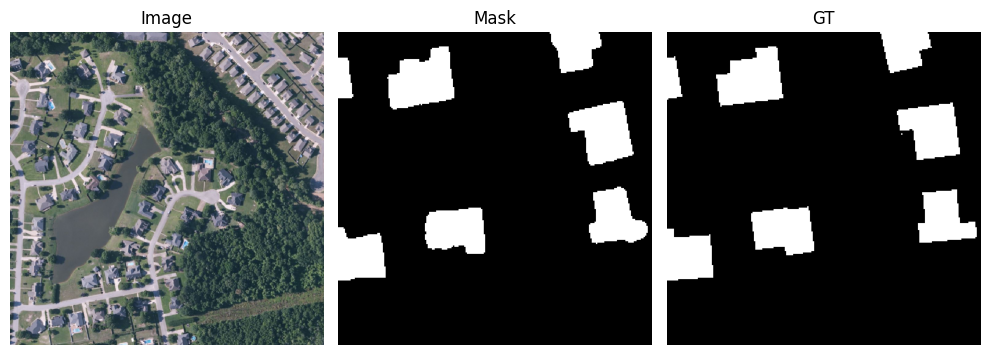

  0%|          | 14/7140 [00:04<34:51,  3.41it/s]

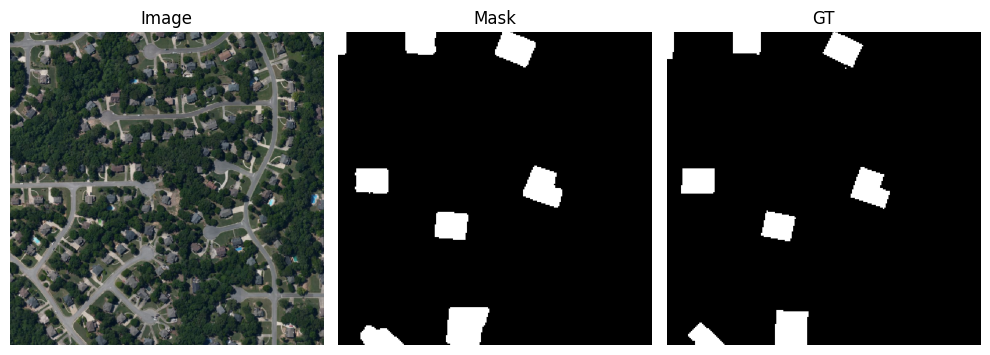

  0%|          | 15/7140 [00:05<34:36,  3.43it/s]

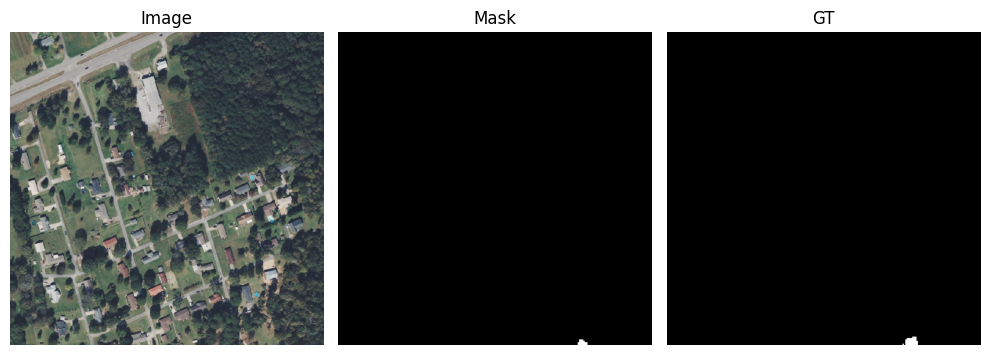

  0%|          | 16/7140 [00:05<41:21,  2.87it/s]

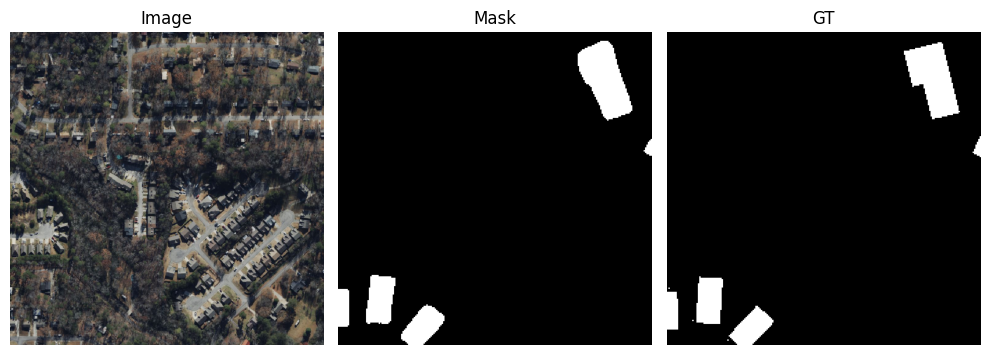

  0%|          | 17/7140 [00:05<38:52,  3.05it/s]

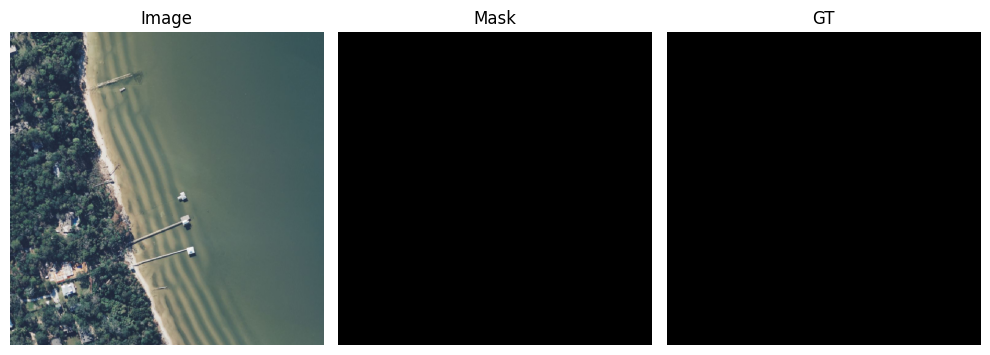

  0%|          | 18/7140 [00:06<36:58,  3.21it/s]

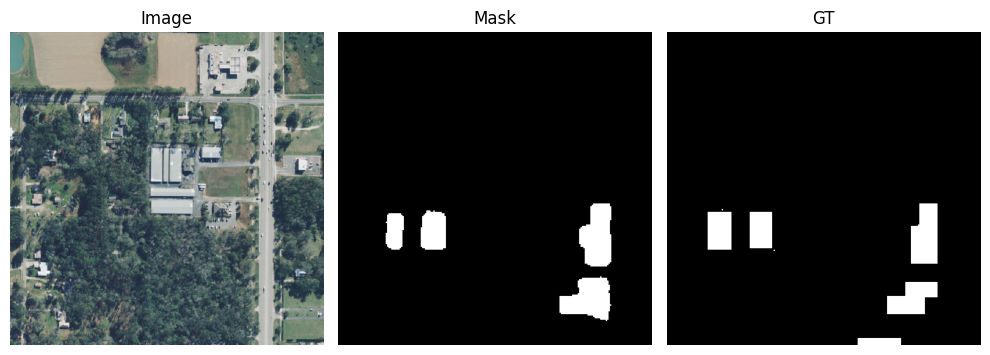

  0%|          | 19/7140 [00:06<35:47,  3.32it/s]

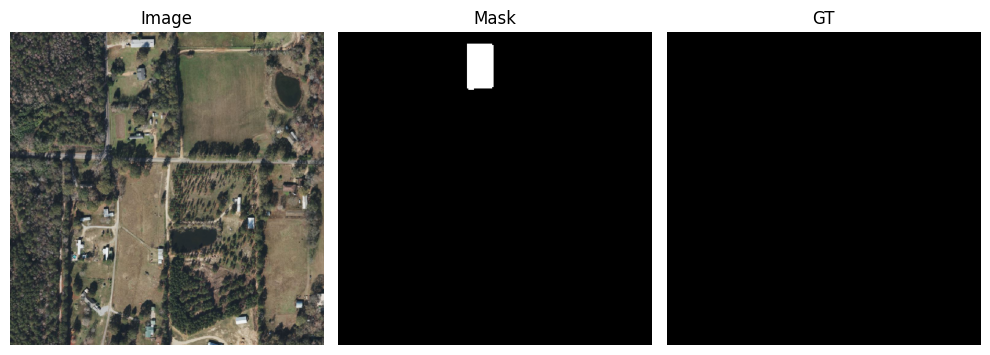

  0%|          | 20/7140 [00:06<34:46,  3.41it/s]

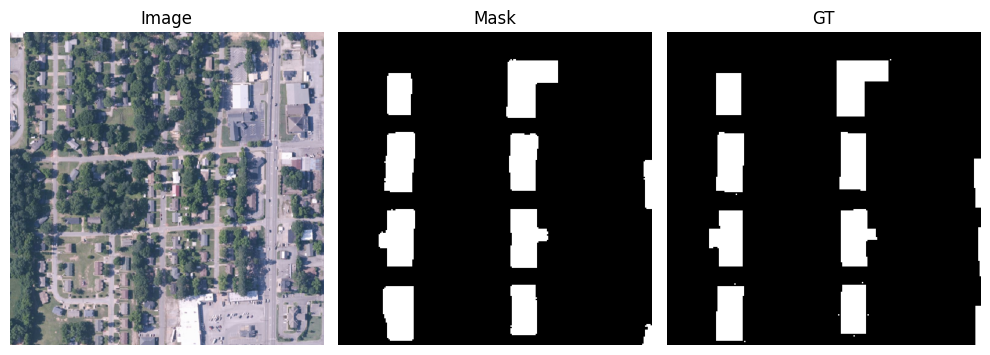

  0%|          | 20/7140 [00:07<41:55,  2.83it/s]


In [19]:
with torch.no_grad():
    model.eval()
    result = []
    i = 0
    for images, mask, orig in tqdm(test_dataloader):
        images = images.float().to(device)        
        outputs = model(images)
        masks = torch.sigmoid(outputs).cpu().numpy()
        masks = np.squeeze(masks, axis=1)
        masks = (masks > 0.35).astype(np.uint8) # Threshold = 0.35
        visualize_mask_and_image(orig, masks, mask)
        if i == 20:
            break
        else:
            i += 1

# Test

In [20]:
transform = A.Compose(
    [   
        A.augmentations.transforms.Normalize(),
        ToTensorV2()
    ]
)

test_dataset = SatelliteDataset(csv_file='./test.csv', transform=transform, infer=True, valid=True)
test_dataloader = DataLoader(test_dataset, batch_size=1, shuffle=False, num_workers=4)

  0%|          | 0/60640 [00:00<?, ?it/s]

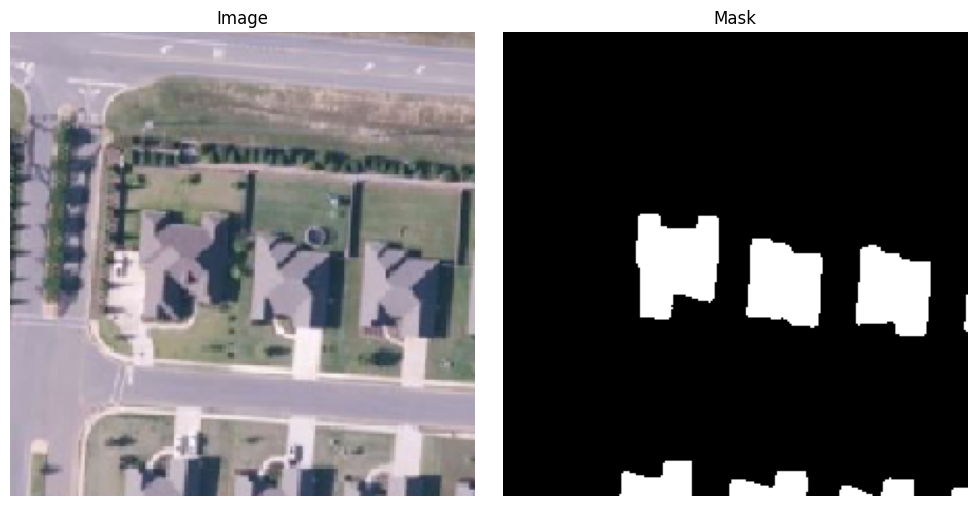

  0%|          | 1/60640 [00:00<10:43:49,  1.57it/s]

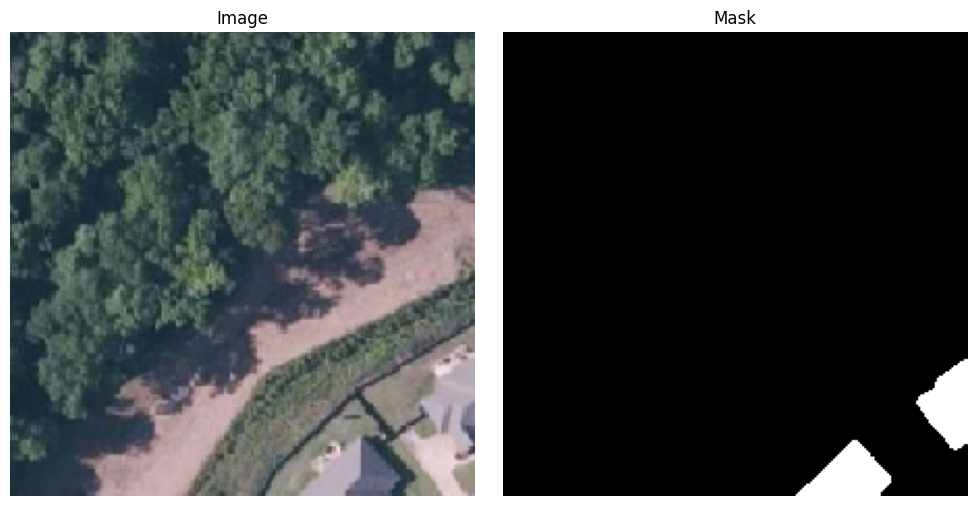

  0%|          | 2/60640 [00:00<6:56:19,  2.43it/s] 

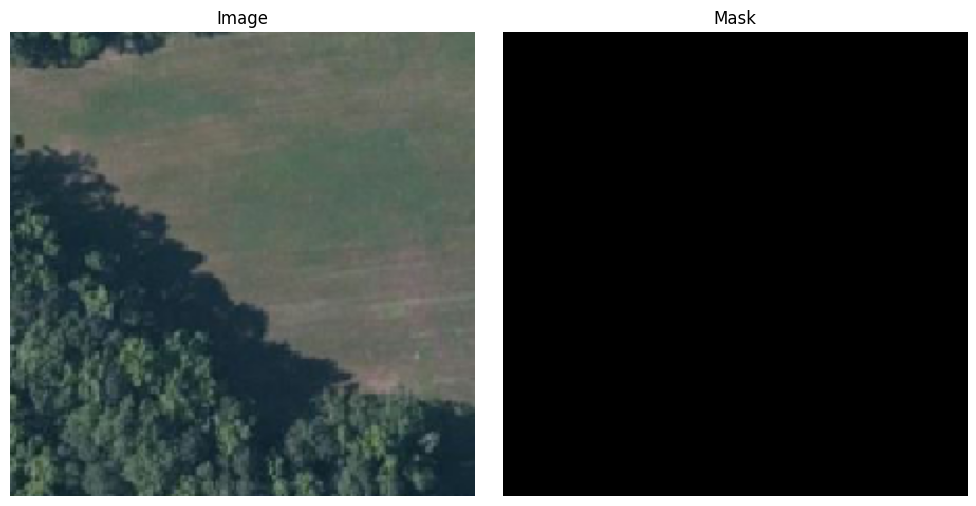

  0%|          | 3/60640 [00:01<5:43:35,  2.94it/s]

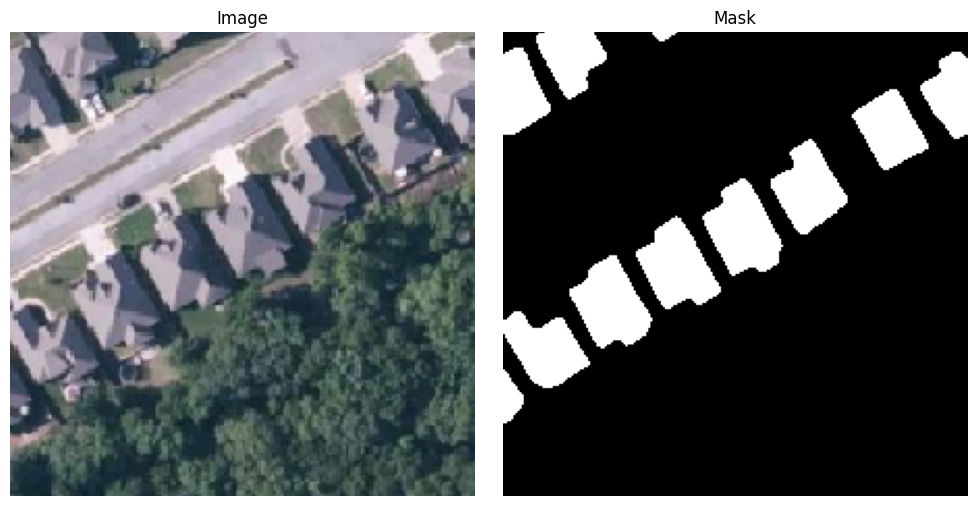

  0%|          | 4/60640 [00:01<5:09:45,  3.26it/s]

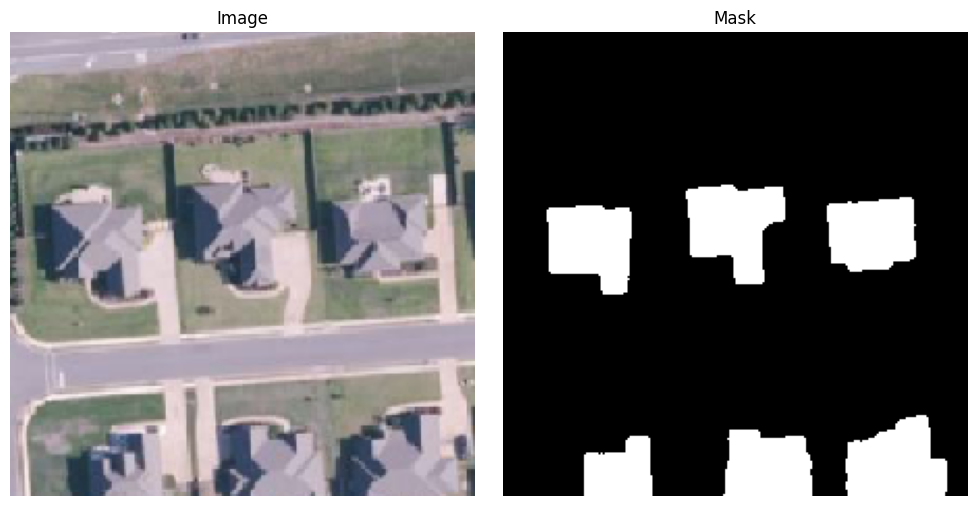

  0%|          | 5/60640 [00:01<4:47:44,  3.51it/s]

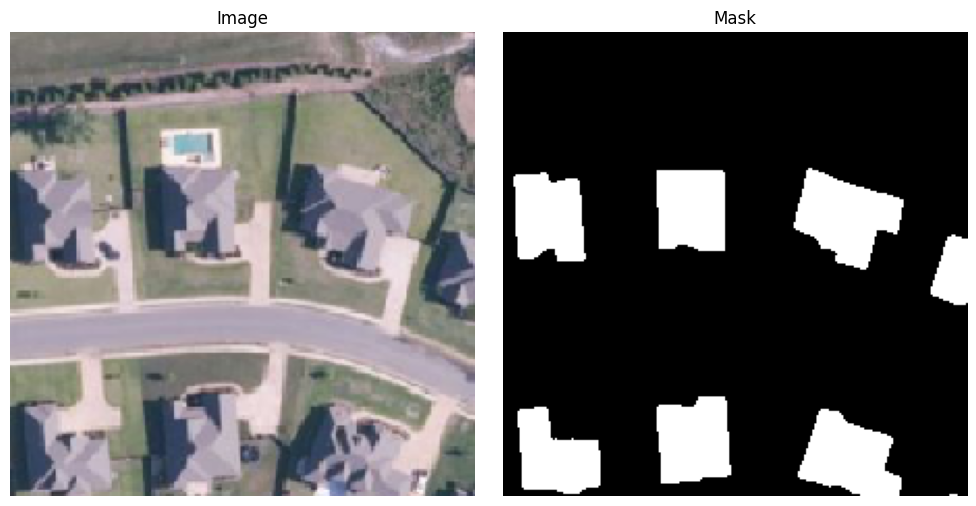

  0%|          | 6/60640 [00:01<4:52:17,  3.46it/s]

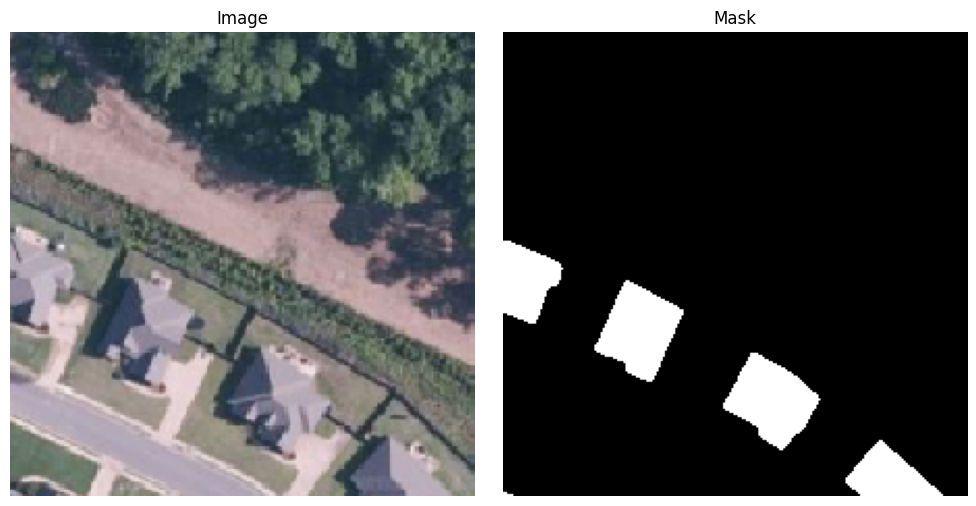

  0%|          | 7/60640 [00:02<4:39:28,  3.62it/s]

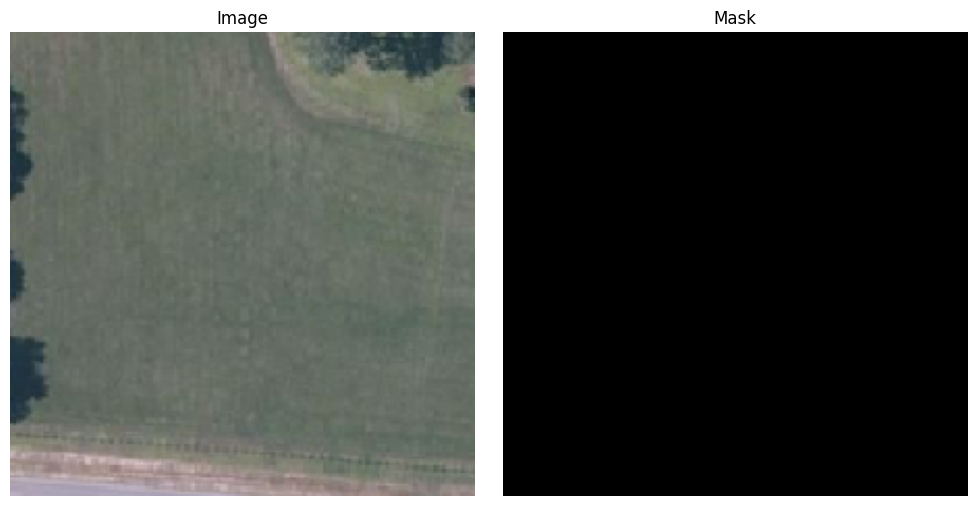

  0%|          | 8/60640 [00:02<4:24:25,  3.82it/s]

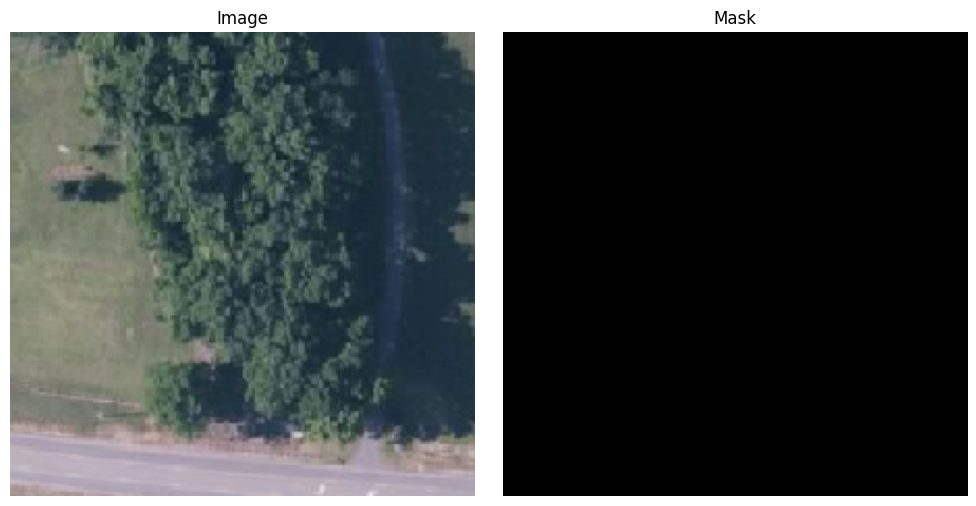

  0%|          | 9/60640 [00:02<4:16:05,  3.95it/s]

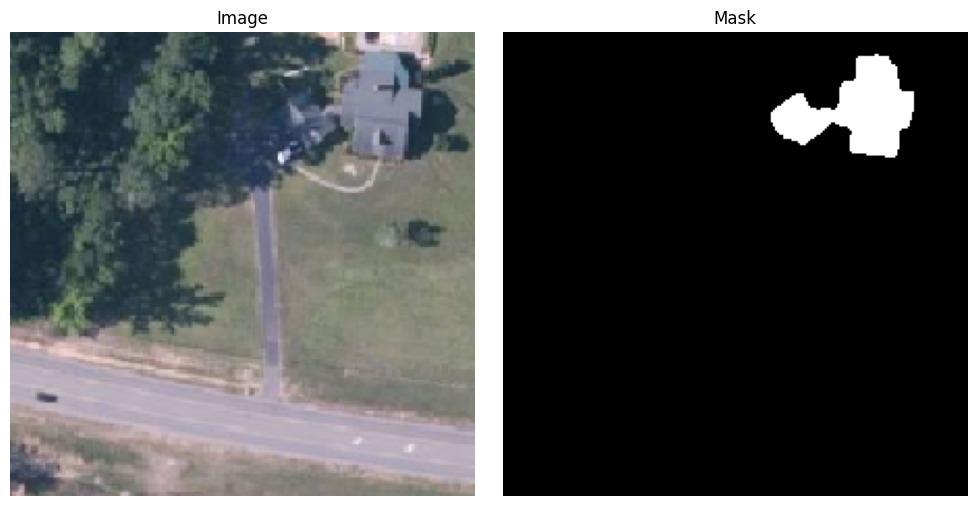

  0%|          | 10/60640 [00:02<4:13:14,  3.99it/s]

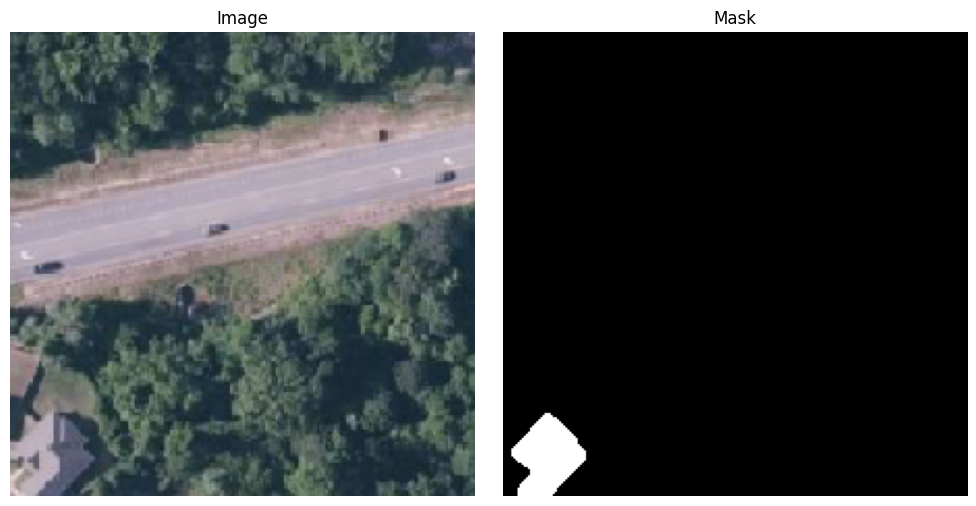

  0%|          | 11/60640 [00:03<4:14:07,  3.98it/s]

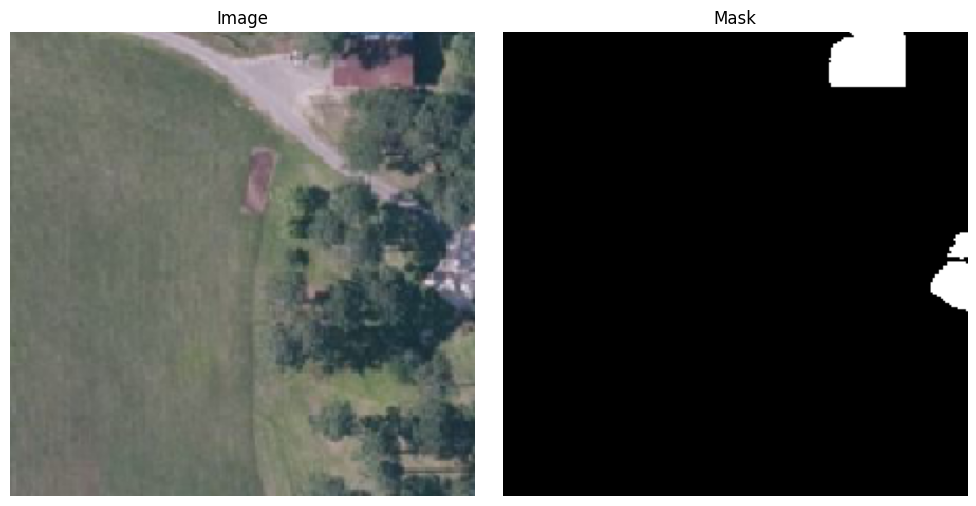

  0%|          | 12/60640 [00:03<5:24:17,  3.12it/s]

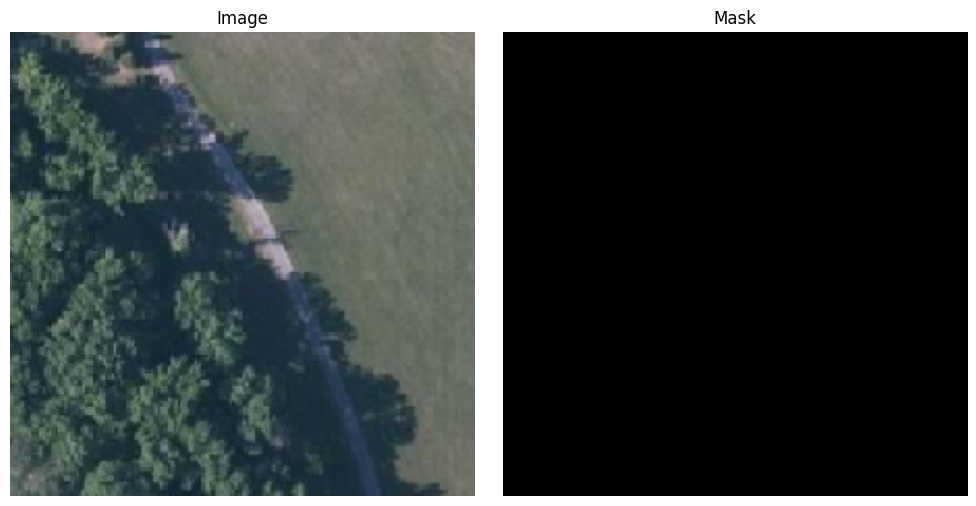

  0%|          | 13/60640 [00:03<4:58:58,  3.38it/s]

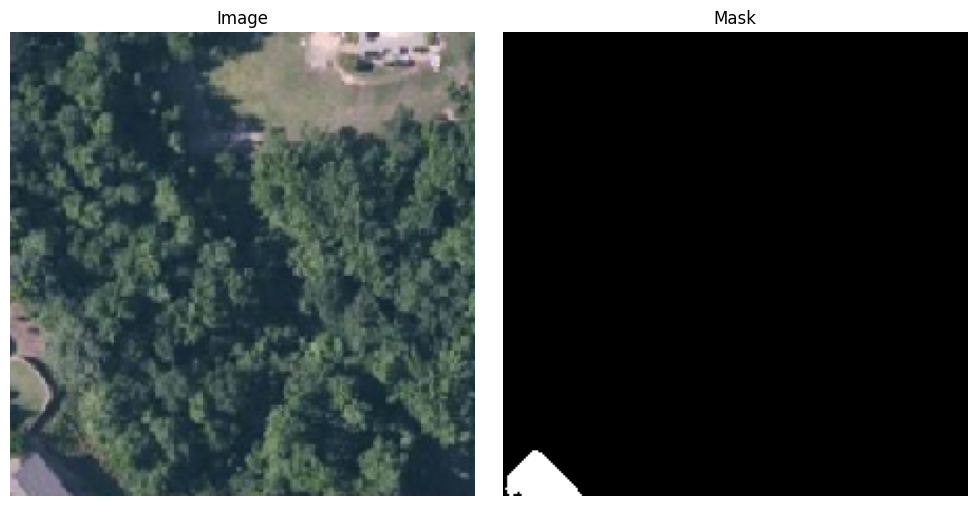

  0%|          | 14/60640 [00:04<4:40:40,  3.60it/s]

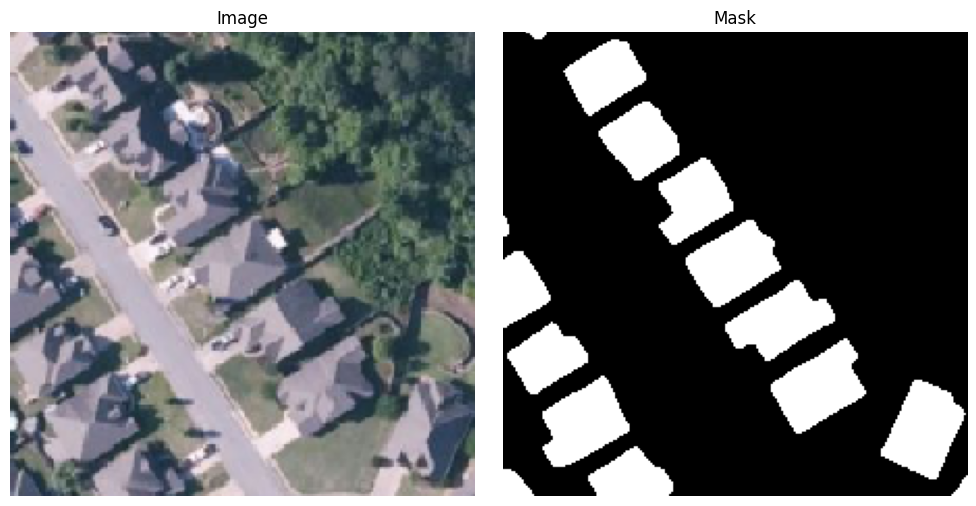

  0%|          | 15/60640 [00:04<4:29:02,  3.76it/s]

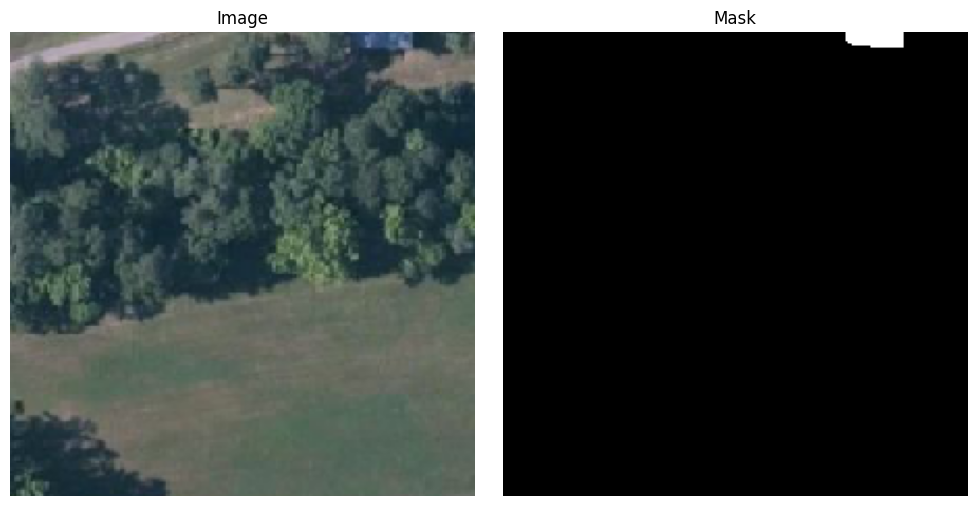

  0%|          | 16/60640 [00:04<4:18:14,  3.91it/s]

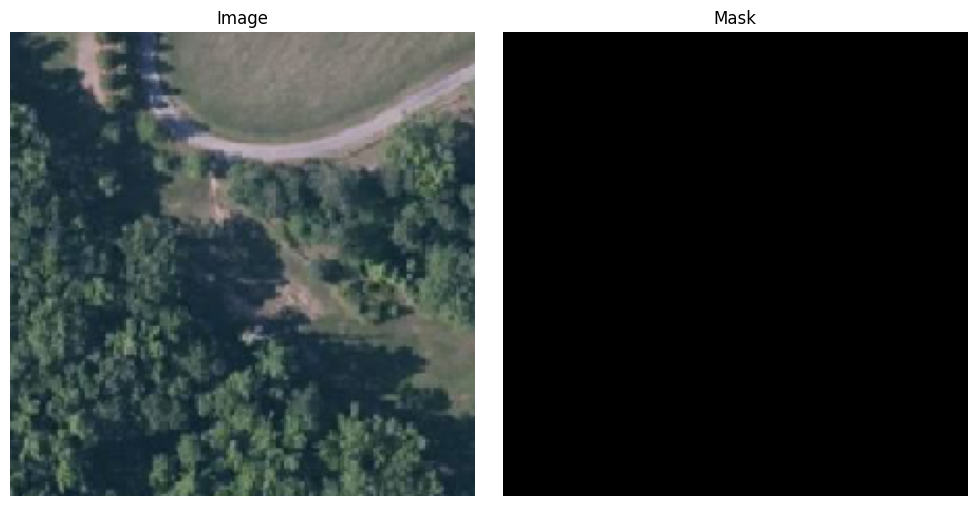

  0%|          | 17/60640 [00:04<4:09:12,  4.05it/s]

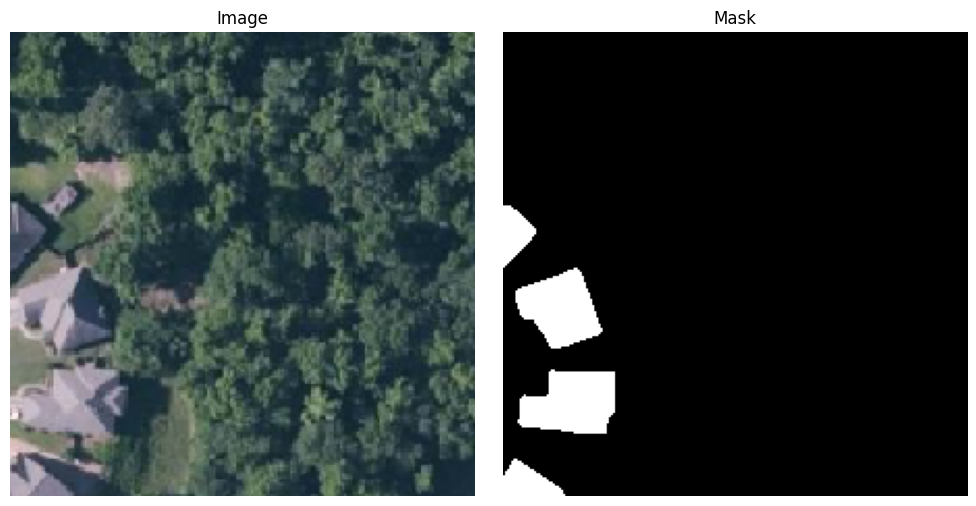

  0%|          | 18/60640 [00:05<4:06:02,  4.11it/s]

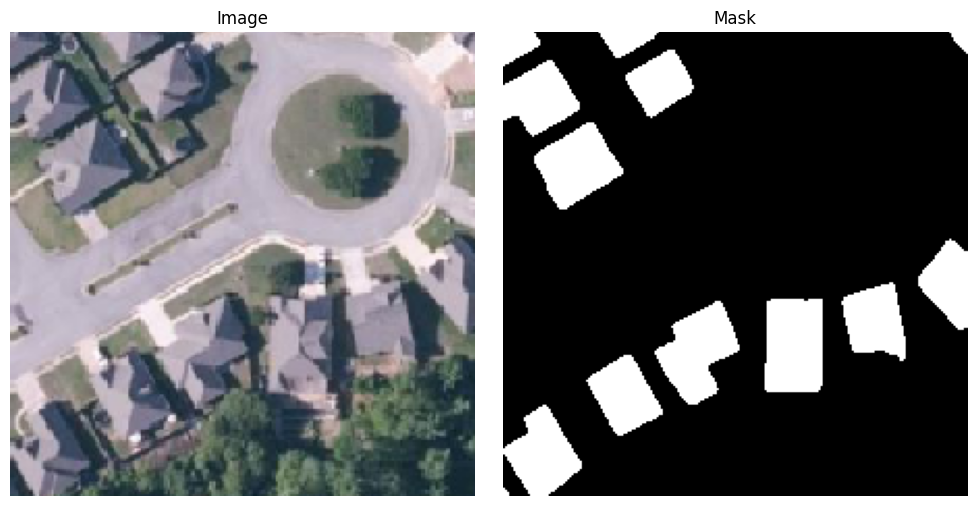

  0%|          | 19/60640 [00:05<4:04:25,  4.13it/s]

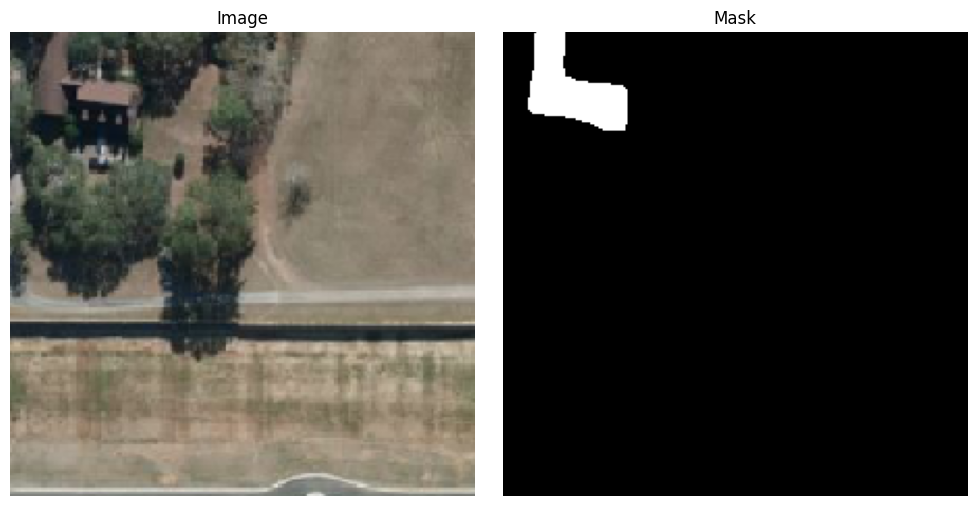

  0%|          | 20/60640 [00:05<4:02:48,  4.16it/s]

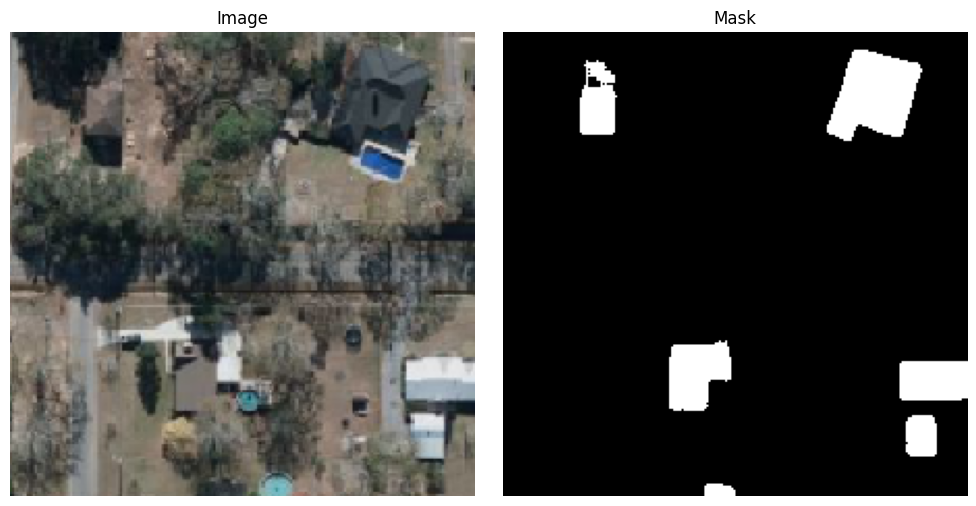

  0%|          | 20/60640 [00:05<4:57:17,  3.40it/s]


In [21]:
with torch.no_grad():
    model.eval()
    result = []
    i = 0
    for images, orig in tqdm(test_dataloader):
        images = images.float().to(device)        
        outputs = model(images)
        masks = torch.sigmoid(outputs).cpu().numpy()
        masks = np.squeeze(masks, axis=1)
        masks = (masks > 0.35).astype(np.uint8) # Threshold = 0.35
        visualize_mask_and_image(orig, masks)
        if i == 20:
            break
        else:
            i += 1